# About Dataset

HR analytics is revolutionising the way human resources departments operate, leading to higher efficiency and better results overall. Human resources has been using analytics for years. However, the collection, processing and analysis of data has been largely manual, and given the nature of human resources dynamics and HR KPIs, the approach has been constraining HR. Therefore, it is surprising that HR departments woke up to the utility of machine learning so late in the game. Here is an opportunity to try predictive analytics in identifying the employees most likely to get promoted.

## Content

Your client is a large MNC and they have 9 broad verticals across the organisation. One of the problem your client is facing is around identifying the right people for promotion (only for manager position and below) and prepare them in time. Currently the process, they are following is:

- They first identify a set of employees based on recommendations/ past performance
- Selected employees go through the separate training and evaluation program for each vertical. These programs are based on the required skill of each vertical
- At the end of the program, based on various factors such as training performance, KPI completion (only employees with KPIs completed greater than 60% are considered) etc., employee gets promotion.

- For above mentioned process, the final promotions are only announced after the evaluation and this leads to delay in transition to their new roles. Hence, company needs your help in identifying the eligible candidates at a particular checkpoint so that they can expedite the entire promotion cycle.

- They have provided multiple attributes around Employee's past and current performance along with demographics. Now, The task is to predict whether a potential promotee at checkpoint in the test set will be promoted or not after the evaluation process.

## Variable Definition

- employee_id: Unique ID for employee

- department: Department of employee

- region: Region of employment (unordered)

- education: Education Level

- gender: Gender of Employee

- recruitment_channel: Channel of recruitment for employee

- no_of_trainings: No. of other trainings completed in previous year on soft skills, technical skills etc.

- age: Age of Employee

- previous_year_rating: Employee Rating for the previous year

- length_of_service: Length of service in years

- KPIs_met >80%: if Percent of KPIs(Key performance Indicators) >80% then 1 else 0

- awards_won?: if awards won during previous year then 1 else 0

- avg_training_score: Average score in current training evaluations

- is_promoted(Target): Recommended for promotion

# Load Data

In [1]:
import matplotlib.pyplot as plt
import plotly_express as px
import seaborn as sns
import pandas as pd
import numpy as np
import os
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
train_filepath = os.path.abspath('Data\\HR_Analytics_Classification\\train.csv')

df = pd.read_csv(train_filepath, header=0)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


# Descriptive analysis

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


## The distribution of variables

In [4]:
df.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


## Descriptive statistics

In [5]:
numeric_variables = ['age', 'length_of_service', 'avg_training_score', 'no_of_trainings', 'previous_year_rating']
numeric_description = df[numeric_variables].describe()
numeric_description

,age,length_of_service,avg_training_score,no_of_trainings,previous_year_rating
count,54808.000000,54808.000000,54808.000000,54808.000000,50684.000000
mean,34.803915,5.865512,63.386750,1.253011,3.329256
std,7.660169,4.265094,13.371559,0.609264,1.259993
min,20.000000,1.000000,39.000000,1.000000,1.000000
25%,29.000000,3.000000,51.000000,1.000000,3.000000
50%,33.000000,5.000000,60.000000,1.000000,3.000000
75%,39.000000,7.000000,76.000000,1.000000,4.000000
max,60.000000,37.000000,99.000000,10.000000,5.000000


## Calculating the mean, median, and standard deviation

In [6]:
numeric_stats = pd.DataFrame({
    'Mean': df.mean(numeric_only=True),
    'Median': df.median(numeric_only=True),
    'Standard Deviation': df.std(numeric_only=True)
})

numeric_stats

,Mean,Median,Standard Deviation
employee_id,39195.830627,39225.5,22586.581449
no_of_trainings,1.253011,1.0,0.609264
age,34.803915,33.0,7.660169
previous_year_rating,3.329256,3.0,1.259993
length_of_service,5.865512,5.0,4.265094
KPIs_met >80%,0.351974,0.0,0.477590
awards_won?,0.023172,0.0,0.150450
avg_training_score,63.386750,60.0,13.371559
is_promoted,0.085170,0.0,0.279137


## The frequency of categorical variables

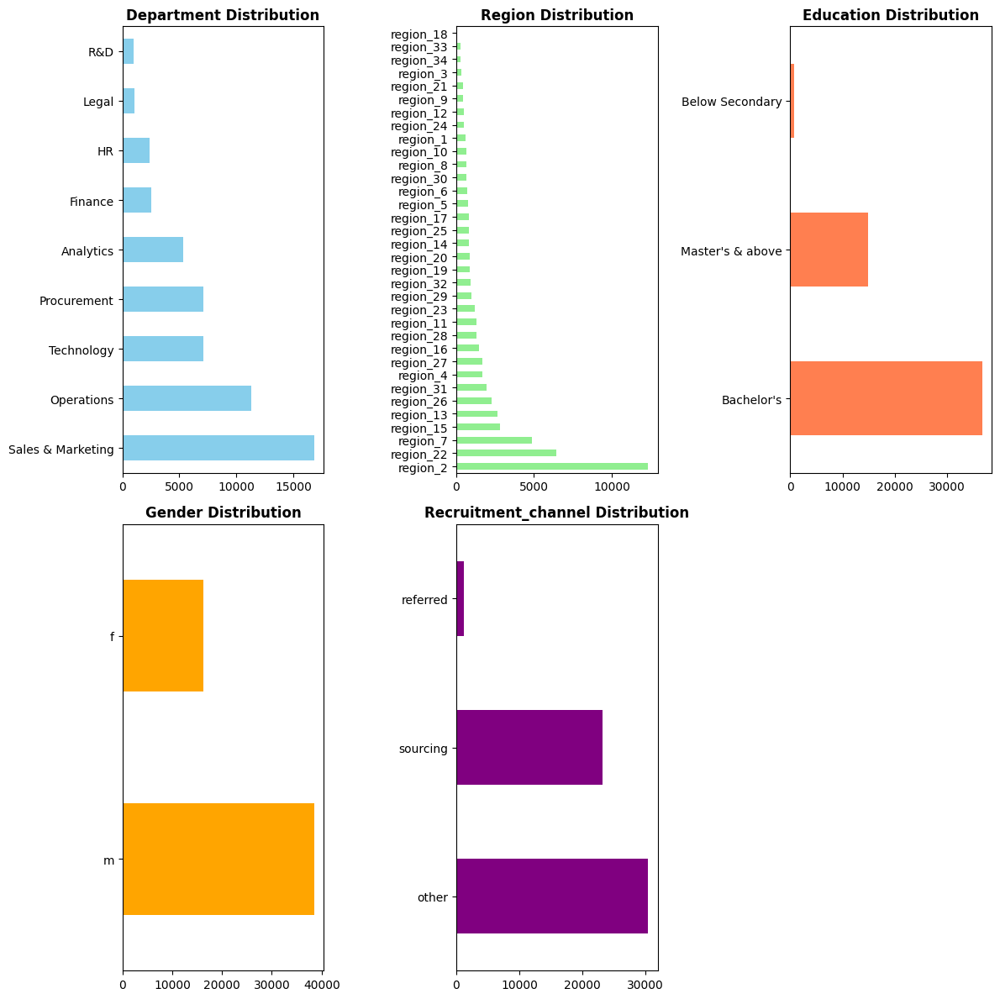

In [7]:
cat_vars = ['department', 'region', 'education', 'gender', 'recruitment_channel']
color = ['skyblue', 'lightgreen', 'coral', 'orange', 'purple']

plt.figure(figsize=(12, 12))

for i in range(len(cat_vars)):
    plt.subplot(2, 3, i+1)
    df[cat_vars[i]].value_counts().plot(kind='barh', color=color[i])
    plt.title(f'{cat_vars[i].capitalize()} Distribution', fontweight='bold')

plt.tight_layout()
plt.show()


# Correlation analysis

## The correlation between numerical variables

<Axes: >

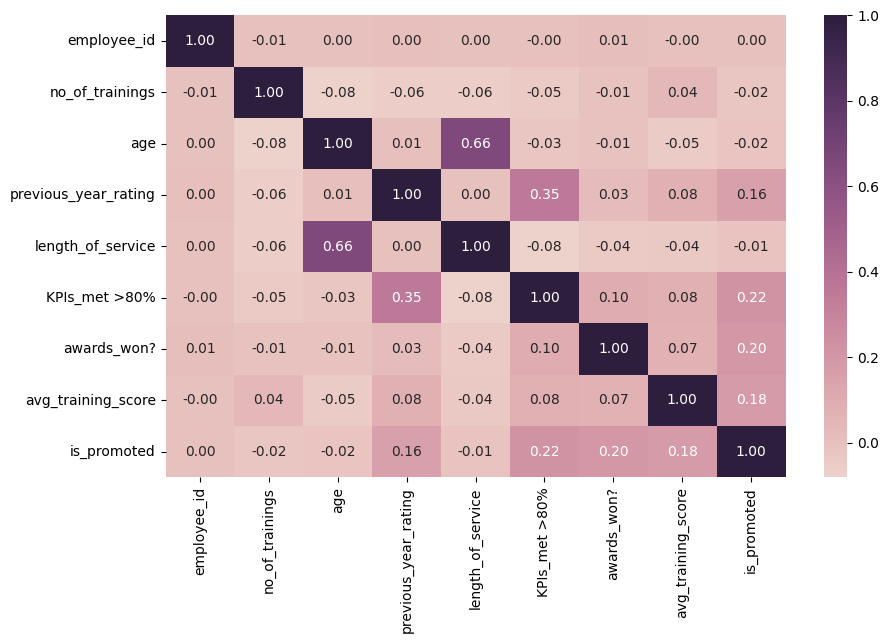

In [8]:
corr_w_f = df.corr(numeric_only=True)

plt.figure(figsize=(10,6))

sns.heatmap(corr_w_f, 
            annot= True, 
            fmt= '.2f',
            cmap= sns.cubehelix_palette(as_cmap=True))


## The correlation between Features and Target

In [9]:
correlation_with_target = df.corr(numeric_only=True)['is_promoted'].sort_values(ascending=False)
correlation_with_target

is_promoted             1.000000
KPIs_met >80%           0.221582
awards_won?             0.195871
avg_training_score      0.181147
previous_year_rating    0.159320
employee_id             0.001206
length_of_service      -0.010670
age                    -0.017166
no_of_trainings        -0.024896
Name: is_promoted, dtype: float64

## Distribution and correlation plots

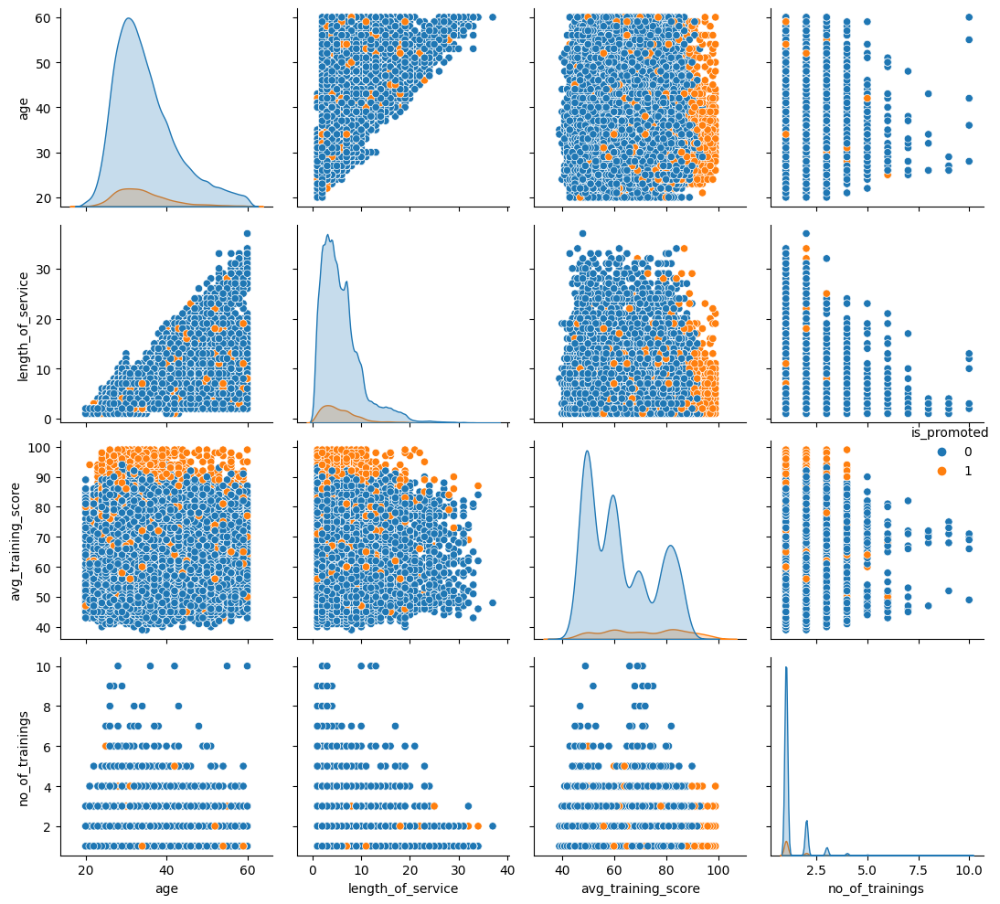

In [10]:
sns.pairplot(df, vars=['age', 'length_of_service', 'avg_training_score', 'no_of_trainings'], hue='is_promoted')
plt.tight_layout()
plt.show()

# Analysis of variable distribution

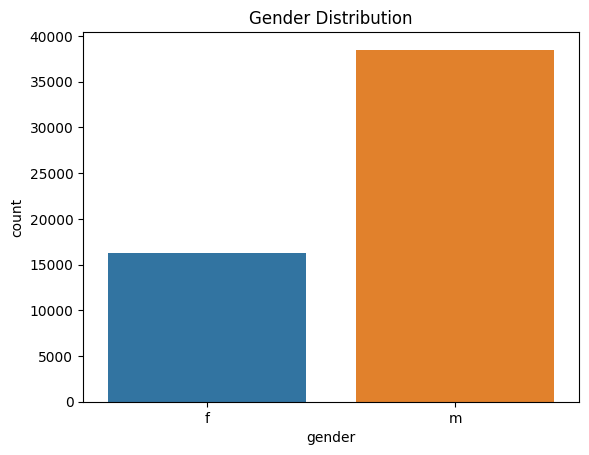

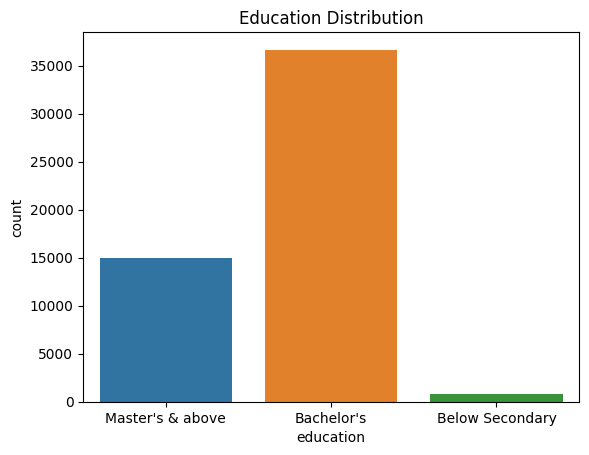

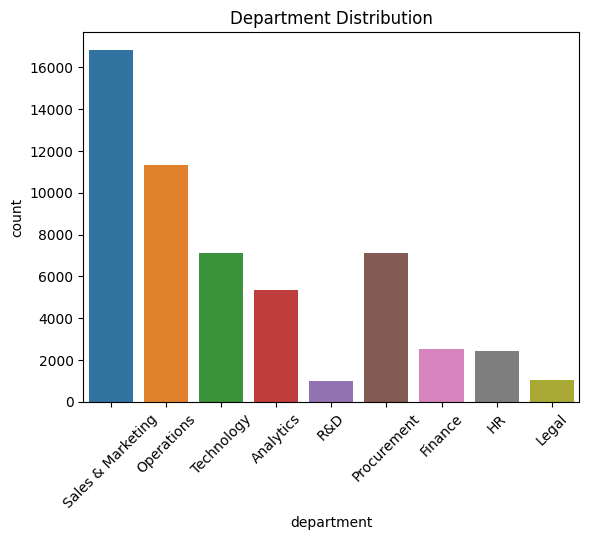

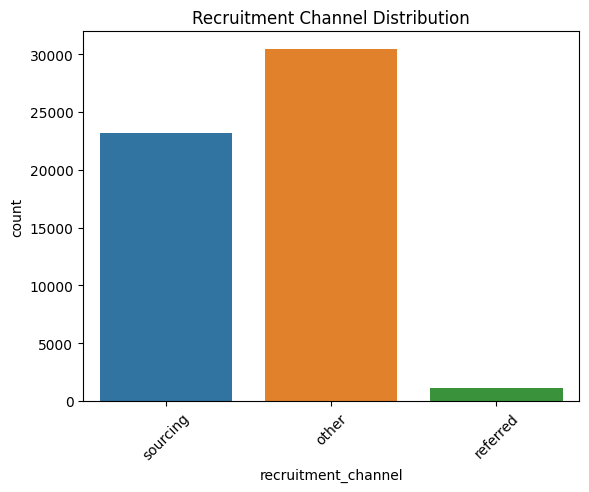

In [11]:
# Gender
sns.countplot(x='gender', data=df)
plt.title('Gender Distribution')
plt.show()

# Education
sns.countplot(x='education', data=df)
plt.title('Education Distribution')
plt.show()

# Department
sns.countplot(x='department', data=df)
plt.title('Department Distribution')
plt.xticks(rotation=45)
plt.show()

# Recruitment Channel
sns.countplot(x='recruitment_channel', data=df)
plt.title('Recruitment Channel Distribution')
plt.xticks(rotation=45)
plt.show()

## The 'age' from the perspective of the 'gender'

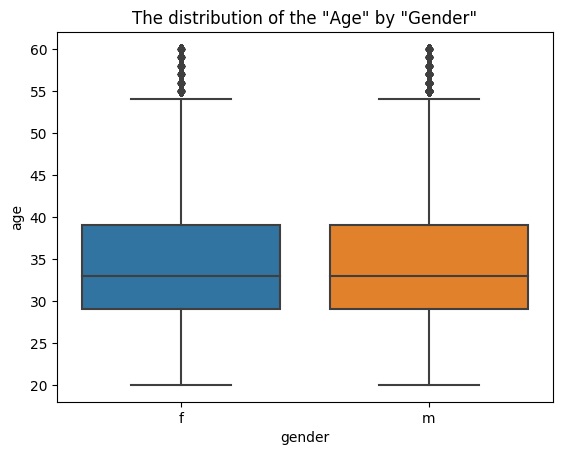

In [12]:
sns.boxplot(x='gender', y='age', data=df)
plt.title('The distribution of the "Age" by "Gender"')
plt.show()

## The 'avg_training_score' from the perspective of the 'department'

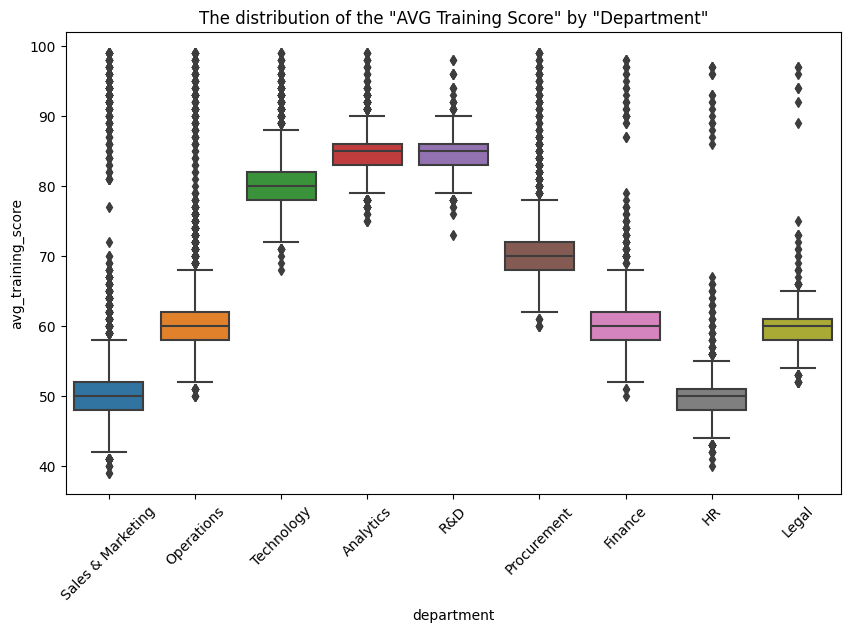

In [13]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='department', y='avg_training_score', data=df)
plt.title('The distribution of the "AVG Training Score" by "Department"')
plt.xticks(rotation=45)
plt.show()

# Analysis of factors influencing promotion

## Distribution of Promoted Employeed based on Department

In [14]:
fig = px.histogram(data_frame= df,
                   title = "Distribution of Promoted Employeed based on Department",
                   x = "department",
                   color = "is_promoted",
                   labels= {"department": "Department", "is_promoted": "Promoted"},
                   )

fig.show()

## Distribution of Promoted Employeed based on Education

In [15]:
fig = px.histogram(data_frame= df,
                   title = "Distribution of Promoted Employeed based on Education",
                   x = "education",
                   color = "is_promoted",
                   labels= {"education": "Level", "is_promoted": "Promoted"},
                   )

fig.show()

## Distribution of Promoted Employeed based on Age

In [16]:
fig = px.histogram(data_frame= df,
                   title = "Distribution of Promoted Employeed based on Age",
                   x = "age",
                   color = "is_promoted",
                   labels= {"age": "Age", "is_promoted": "Promoted"},
                   )

fig.show()

## Distribution of Promoted Employeed based on Previous Year Rating

In [17]:
fig = px.histogram(data_frame= df,
                   title = "Distribution of Promoted Employeed based on Previous Year Rating",
                   x = "previous_year_rating",
                   color = "is_promoted",
                   labels= {"previous_year_rating": "Rate", "is_promoted": "Promoted"},
                   )

fig.show()

## Distribution of Promoted Employeed based on Length Of Service

In [18]:
fig = px.histogram(data_frame= df,
                   title = "Distribution of Promoted Employeed based on Length Of Service",
                   x = "length_of_service",
                   color = "is_promoted",
                   labels= {"length_of_service": "Length Of Service", "is_promoted": "Promoted"},
                   )

fig.show()

## Distribution of Promoted Employeed based on KPIs

In [19]:
fig = px.histogram(data_frame= df,
                   title = "Distribution of Promoted Employeed based on Key Performance Indicator",
                   x = "KPIs_met >80%",
                   color = "is_promoted",
                   labels= {"KPIs_met >80%": "KPIs met >80%", "is_promoted": "Promoted"},
                   )

fig.show()

## Distribution of Promoted Employeed based on Awards Won

In [20]:
fig = px.histogram(data_frame= df,
                   title = "Distribution of Promoted Employeed based on Awards Won",
                   x = "awards_won?",
                   color = "is_promoted",
                   labels= {"awards_won?": "Awards Won", "is_promoted": "Promoted"},
                   )

fig.show()

## Distribution of Promoted Employeed based on AVG Training Score

In [21]:
fig = px.histogram(data_frame= df,
                   title = "Distribution of Promoted Employeed based on AVG Training Score",
                   x = "avg_training_score",
                   color = "is_promoted",
                   labels= {"avg_training_score": "AVG Training Score", "is_promoted": "Promoted"},
                   )

fig.show()

# Analysis of promotion rates by each characteristic

## Proportion of the amount of data divided based on each target

Percentage employees get promoted: 8.52%
Percentage employees are not promoted: 91.48%


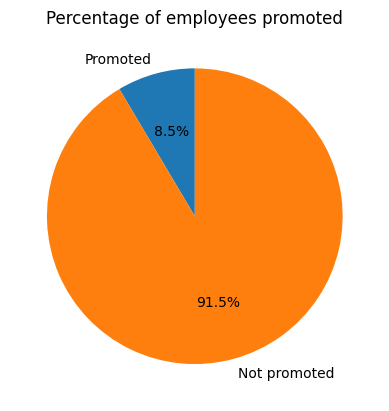

In [22]:
target_count = df['is_promoted'].value_counts()
t_promoted = target_count[1]
t_not_promoted = target_count[0]
total_emp = t_promoted + t_not_promoted

not_promoted = round((t_not_promoted/total_emp)*100,2)
promoted = round((t_promoted/total_emp)*100,2)

labels = ['Promoted', "Not promoted"]
sizes = [promoted, not_promoted]

plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)

plt.title('Percentage of employees promoted')

print(f"Percentage employees get promoted: {promoted}%\nPercentage employees are not promoted: {not_promoted}%")

plt.show()

## Analysis of the probability of employees being promoted 

### Probability to Get Promotion based on Department 

In [23]:
proba_dpm = df.groupby(['department', 'is_promoted'])['employee_id'].count().reset_index()

proba_dpm = proba_dpm.pivot_table(index='department',
                                  columns='is_promoted',
                                  values='employee_id').reset_index()

proba_dpm.columns = ['department', 'non-promoted', 'promoted']

proba_dpm['total_emp'] = proba_dpm['non-promoted'] + proba_dpm['promoted']

proba_dpm['probability'] = np.round((proba_dpm['promoted'] / proba_dpm['total_emp']) * 100, 2)

proba_dpm = proba_dpm.sort_values(by='probability', ascending=False)

proba_dpm

,department,non-promoted,promoted,total_emp,probability
8,Technology,6370,768,7138,10.76
5,Procurement,6450,688,7138,9.64
0,Analytics,4840,512,5352,9.57
4,Operations,10325,1023,11348,9.01
1,Finance,2330,206,2536,8.12
7,Sales & Marketing,15627,1213,16840,7.20
6,R&D,930,69,999,6.91
2,HR,2282,136,2418,5.62
3,Legal,986,53,1039,5.10


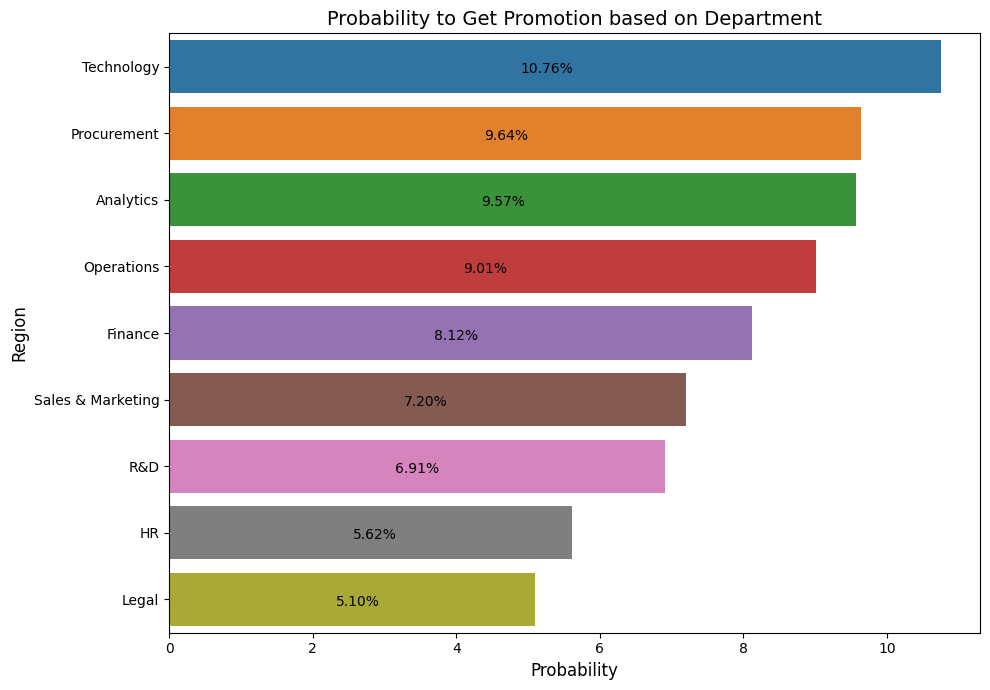

In [24]:
fig, ax = plt.subplots(figsize=(10, 7))

dmp = sns.barplot(data=proba_dpm,
                  x='probability',
                  y='department')

for p in dmp.patches:
    width = p.get_width()

    plt.text(x=width/2.2,
             y=p.get_y() + (p.get_height()/2) + 0.1,
             s=f'{width:.2f}%')

plt.title('Probability to Get Promotion based on Department', fontsize=14)
plt.xlabel('Probability', fontsize=12)
plt.ylabel('Region', fontsize=12)
plt.tight_layout()

### Probability to Get Promotion based on Region

In [25]:
prob_reg = df.groupby(['region', 'is_promoted'])['employee_id'].count().reset_index()

prob_reg = prob_reg.pivot_table(index='region',
                                  columns='is_promoted',
                                  values='employee_id').reset_index()

prob_reg.columns = ['region', 'non-promoted', 'promoted']

prob_reg['total_emp'] = prob_reg['non-promoted'] + prob_reg['promoted']

prob_reg['probability'] = np.round((prob_reg['promoted'] / prob_reg['total_emp']) * 100, 2)

prob_reg = prob_reg.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_reg

,region,non-promoted,promoted,total_emp,probability
0,region_4,1457,246,1703,14.45
1,region_17,687,109,796,13.69
2,region_25,716,103,819,12.58
3,region_28,1164,154,1318,11.68
4,region_23,1038,137,1175,11.66
5,region_22,5694,734,6428,11.42
6,region_3,309,37,346,10.69
7,region_7,4327,516,4843,10.65
8,region_1,552,58,610,9.51
9,region_30,598,59,657,8.98


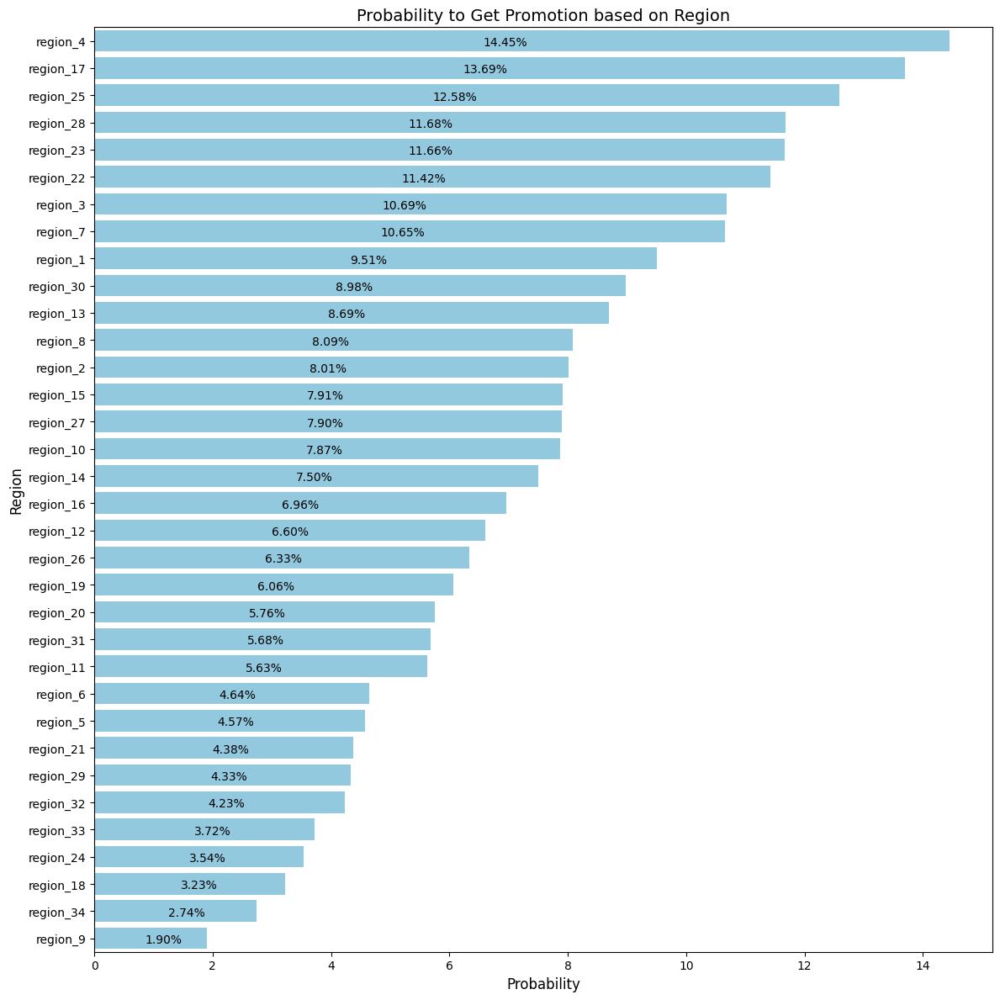

In [26]:
fig, ax = plt.subplots(figsize=(12, 12))

reg = sns.barplot(data= prob_reg,
                  x='probability',
                  y='region',
                  color='skyblue',
                  order=prob_reg.sort_values('probability', ascending=False)['region'])

for p in reg.patches:
    width = p.get_width()

    plt.text(x=width / 2.2,
             y=p.get_y() + (p.get_height() / 2) + 0.17,
             s=f'{width:.2f}%')

plt.title('Probability to Get Promotion based on Region', fontsize=14)
plt.xlabel('Probability', fontsize=12)
plt.ylabel('Region', fontsize=12)
plt.tight_layout()

### Probability to Get Promotion based on Education

In [27]:
prob_edu = df.groupby(['education', 'is_promoted'])['employee_id'].count().reset_index()

prob_edu = prob_edu.pivot_table(index='education',
                                columns='is_promoted',
                                values='employee_id').reset_index()
prob_edu.columns = ['education', 'non-promoted', 'promoted']

prob_edu['total_emp'] = prob_edu['non-promoted'] + prob_edu['promoted']

prob_edu['probability'] = np.round((prob_edu['promoted'] / prob_edu['total_emp']) * 100, 2)

prob_edu = prob_edu.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_edu

,education,non-promoted,promoted,total_emp,probability
0,Master's & above,13454,1471,14925,9.86
1,Below Secondary,738,67,805,8.32
2,Bachelor's,33661,3008,36669,8.20


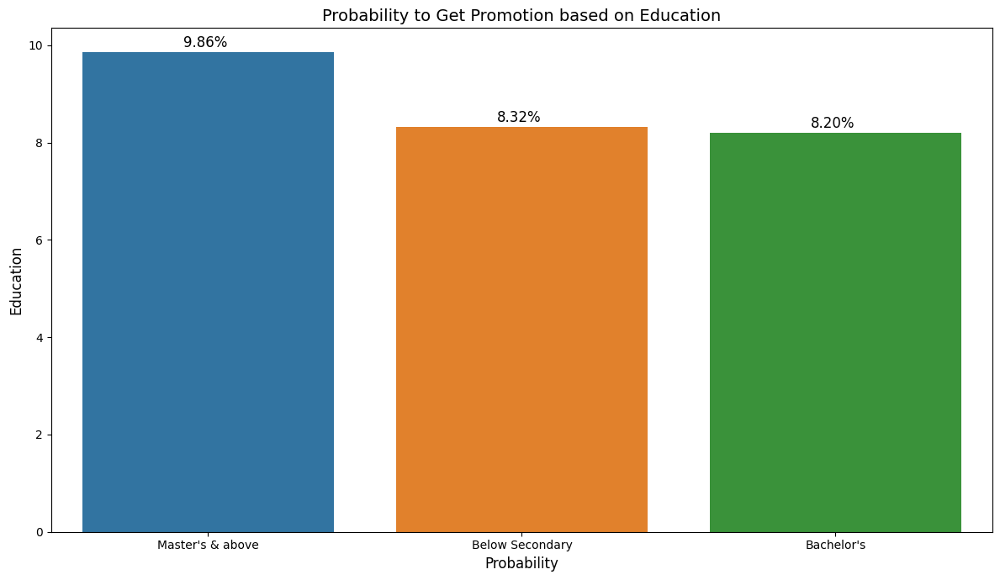

In [28]:
fig, ax = plt.subplots(figsize=(12,7))

edu = sns.barplot(data=prob_edu,
                  x='education',
                  y='probability')

for p in edu.patches:
    height = p.get_height()

    plt.text(x=p.get_x() + (p.get_width() / 2.5),
             y=height + 0.1,
             s=f'{height:.2f}%',
             fontsize=12)

plt.title('Probability to Get Promotion based on Education', fontsize=14)
plt.xlabel('Probability', fontsize=12)
plt.ylabel('Education', fontsize=12)
plt.tight_layout()

### Probability to Get Promotion based on Gender

In [29]:
prob_gen = df.groupby(['gender', 'is_promoted'])['employee_id'].count().reset_index()

prob_gen = prob_gen.pivot_table(index='gender',
                                columns='is_promoted',
                                values='employee_id').reset_index()

prob_gen.columns = ['gender', 'non-promoted', 'promoted']

prob_gen['total_emp'] = prob_gen['non-promoted'] + prob_gen['promoted']

prob_gen['probability'] = np.round((prob_gen['promoted'] / prob_gen['total_emp']) * 100, 2)

prob_gen = prob_gen.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_gen

,gender,non-promoted,promoted,total_emp,probability
0,f,14845,1467,16312,8.99
1,m,35295,3201,38496,8.32


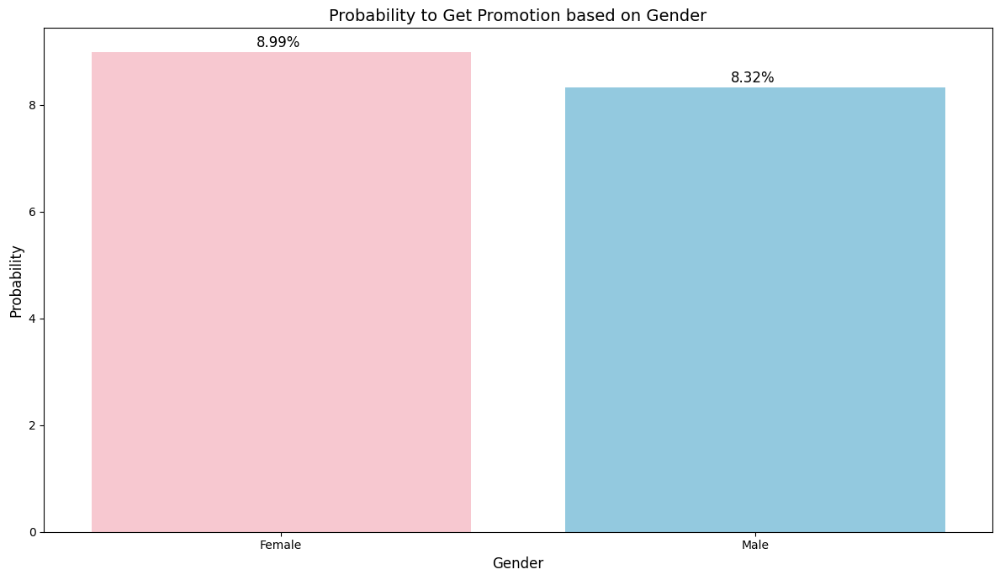

In [30]:
fig, ax = plt.subplots(figsize=(12, 7))

gender = sns.barplot(data=prob_gen,
                     x='gender',
                     y='probability',
                     palette={'f': 'pink', 'm': 'skyblue'})

for p in gender.patches:
    height = p.get_height()

    plt.text(x=p.get_x() + (p.get_width() / 2.3),
             y=height + 0.1,
             s=f'{height:.2f}%',
             fontsize=12)

gender.set_xticklabels(['Female', 'Male'])
plt.title('Probability to Get Promotion based on Gender', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Probability', fontsize=12)
plt.tight_layout()

### Probability to Get Promotion based on Recruitment Channel

In [31]:
prob_rcmc = df.groupby(['recruitment_channel', 'is_promoted'])['employee_id'].count().reset_index()

prob_rcmc = prob_rcmc.pivot_table(index='recruitment_channel',
                                  columns='is_promoted',
                                  values='employee_id').reset_index()

prob_rcmc.columns = ['recruitment_channel', 'non-promoted', 'promoted']

prob_rcmc['total_emp'] = prob_rcmc['non-promoted'] + prob_rcmc['promoted']

prob_rcmc['probability'] = np.round((prob_rcmc['promoted'] / prob_rcmc['total_emp']) * 100, 2)

prob_rcmc = prob_rcmc.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_rcmc


,recruitment_channel,non-promoted,promoted,total_emp,probability
0,referred,1004,138,1142,12.08
1,sourcing,21246,1974,23220,8.50
2,other,27890,2556,30446,8.40


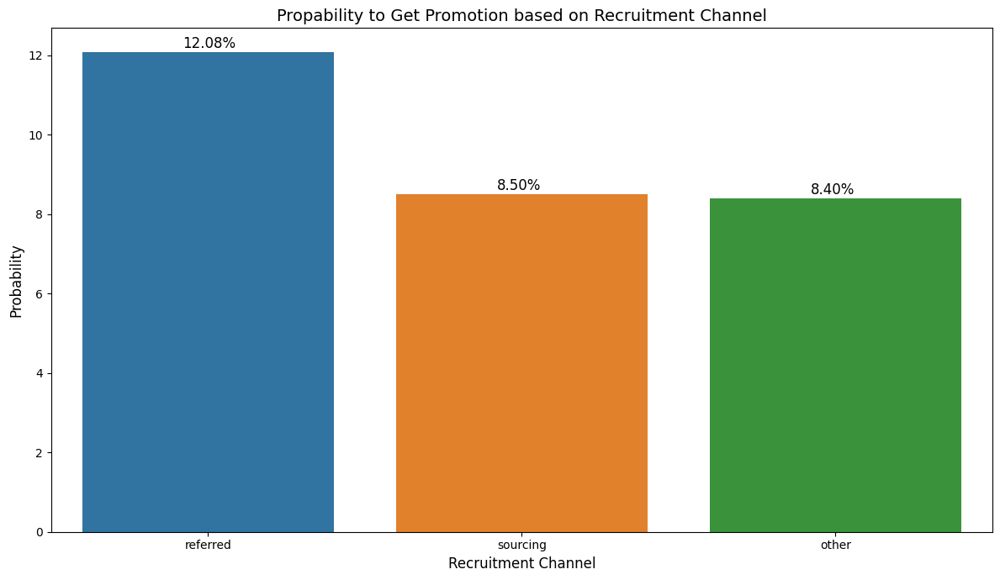

In [32]:
fig, ax = plt.subplots(figsize=(12, 7))

rcmc = sns.barplot(data=prob_rcmc,
                   x='recruitment_channel',
                   y='probability')

for p in rcmc.patches:
    height = p.get_height()

    plt.text(x=p.get_x() + (p.get_width() / 2.5),
             y=height + 0.1,
             s=f'{height:.2f}%',
             fontsize=12)
    
plt.title('Propability to Get Promotion based on Recruitment Channel', fontsize=14)
plt.xlabel('Recruitment Channel', fontsize=12)
plt.ylabel('Probability', fontsize=12)
plt.tight_layout()

### Probability to Get Promotion based on Number Of Trainings

In [33]:
prob_notrain = df.groupby(['no_of_trainings', 'is_promoted'])['employee_id'].count().reset_index()

prob_notrain = prob_notrain.pivot_table(index='no_of_trainings',
                                        columns='is_promoted',
                                        values='employee_id').reset_index()

prob_notrain.columns = ['no_of_trainings', 'non-promoted', 'promoted']

prob_notrain['total_emp'] = prob_notrain['non-promoted'] + prob_notrain['promoted']

prob_notrain['probability'] = np.round((prob_notrain['promoted'] / prob_notrain['total_emp']) * 100, 2)

prob_notrain = prob_notrain.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_notrain.dropna(subset=['probability'], inplace=True)

prob_notrain

,no_of_trainings,non-promoted,promoted,total_emp,probability
0,1,40468.0,3910.0,44378.0,8.81
1,2,7382.0,605.0,7987.0,7.57
2,3,1654.0,122.0,1776.0,6.87
3,4,442.0,26.0,468.0,5.56
4,6,42.0,2.0,44.0,4.55
5,5,125.0,3.0,128.0,2.34


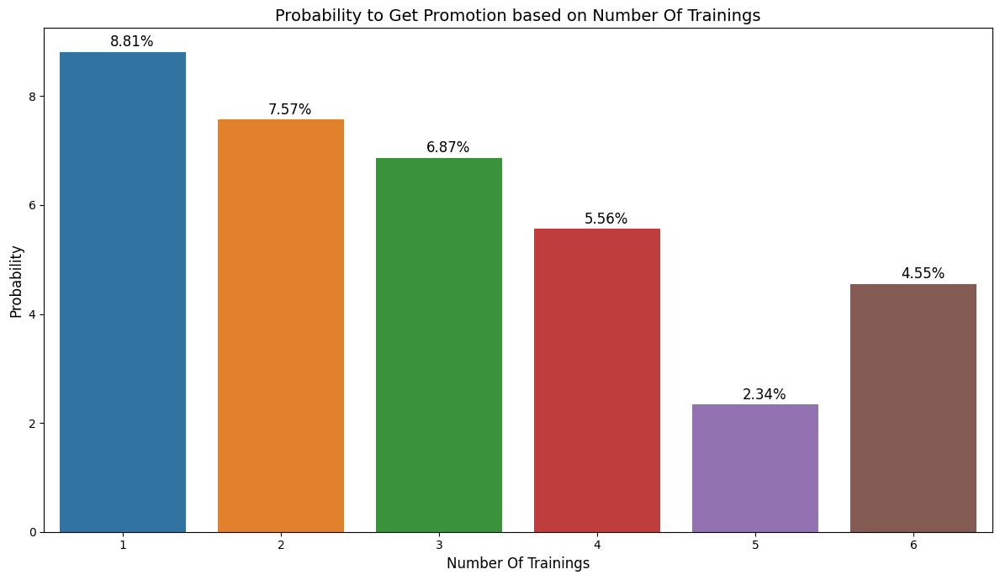

In [34]:
fig, ax = plt.subplots(figsize=(12, 7))

notrain = sns.barplot(data=prob_notrain,
                      x='no_of_trainings',
                      y='probability')

for p in notrain.patches:
    height = p.get_height()

    plt.text(x=p.get_x() + (p.get_width() / 2.5),
             y=height + 0.1,
             s=f'{height:.2f}%',
             fontsize=12)

plt.title('Probability to Get Promotion based on Number Of Trainings', fontsize=14)
plt.xlabel('Number Of Trainings', fontsize=12)
plt.ylabel('Probability', fontsize=12)
plt.tight_layout()

### Probability to Get Promotion based on Age

In [35]:
prob_age = df.groupby(['age', 'is_promoted'])['employee_id'].count().reset_index()

prob_age = prob_age.pivot_table(index='age',
                                columns='is_promoted',
                                values='employee_id').reset_index()

prob_age.columns = ['age', 'non-promoted', 'promoted']

prob_age['total_emp'] = prob_age['non-promoted'] + prob_age['promoted']

prob_age['probability'] = np.round((prob_age['promoted'] / prob_age['total_emp']) * 100, 2)

prob_age = prob_age.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_age.dropna(subset=['probability'], inplace=True)

prob_age

,age,non-promoted,promoted,total_emp,probability
0,35,2428,283,2711,10.44
1,33,2891,319,3210,9.94
2,28,2839,308,3147,9.79
3,38,1739,184,1923,9.57
4,39,1534,161,1695,9.50
5,34,2790,286,3076,9.30
6,27,2566,261,2827,9.23
7,30,3341,324,3665,8.84
8,31,3224,310,3534,8.77
9,51,355,34,389,8.74


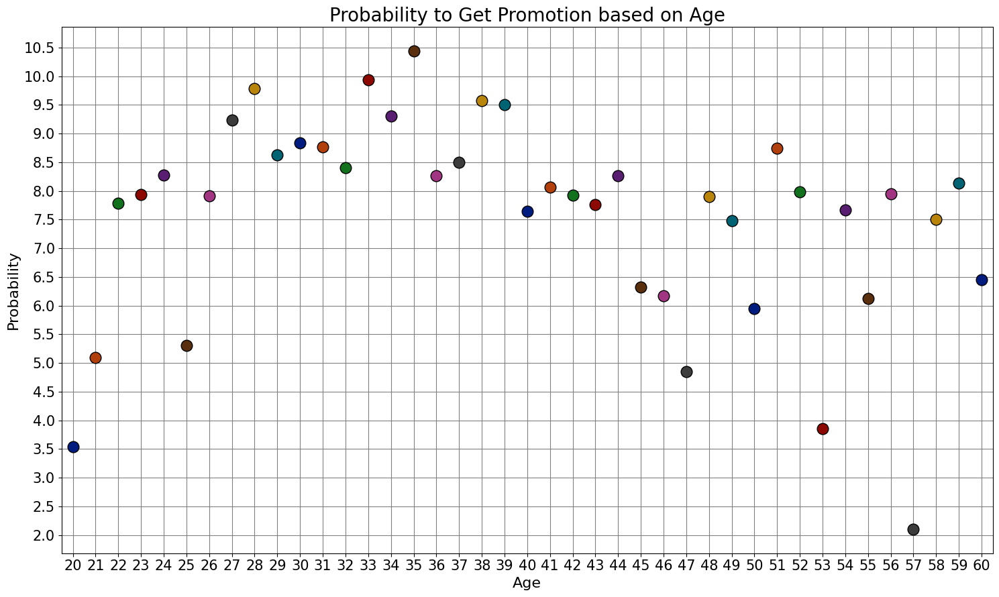

In [36]:
fig, ax = plt.subplots(figsize=(15, 9))

age = sns.stripplot(data=prob_age,
                        x='age',
                        y='probability',
                        marker='o',
                        size=12,
                        jitter=True,  
                        palette='dark',
                        edgecolor='black',
                        linewidth=1
                        )

ax.xaxis.grid(True, color='gray')
ax.yaxis.grid(True, color='gray')
plt.xticks(rotation=0, fontsize=15)
ax.set_yticks(np.arange(2.0, 11.0, 0.5))
plt.yticks(fontsize=15)
plt.title('Probability to Get Promotion based on Age', fontsize=20)
plt.xlabel('Age', fontsize=16)
plt.ylabel('Probability', fontsize=16)
plt.tight_layout()

### Probability to Get Promoted based on Length Of Service

In [37]:
prob_los = df.groupby(['length_of_service', 'is_promoted'])['employee_id'].count().reset_index()

prob_los = prob_los.pivot_table(index='length_of_service',
                                columns='is_promoted',
                                values='employee_id').reset_index()

prob_los.columns = ['length_of_service', 'non-promoted', 'promoted']

prob_los['total_emp'] = prob_los['non-promoted'] + prob_los['promoted']

prob_los['probability'] = np.round((prob_los['promoted'] / prob_los['total_emp']) * 100, 2)

prob_los = prob_los.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_los.dropna(subset=['probability'], inplace=True)

prob_los

,length_of_service,non-promoted,promoted,total_emp,probability
0,34,3.0,1.0,4.0,25.00
1,32,8.0,2.0,10.0,20.00
2,23,58.0,7.0,65.0,10.77
3,11,820.0,96.0,916.0,10.48
4,29,27.0,3.0,30.0,10.00
5,22,55.0,6.0,61.0,9.84
6,19,297.0,32.0,329.0,9.73
7,8,2614.0,269.0,2883.0,9.33
8,10,1989.0,204.0,2193.0,9.30
9,2,6089.0,595.0,6684.0,8.90


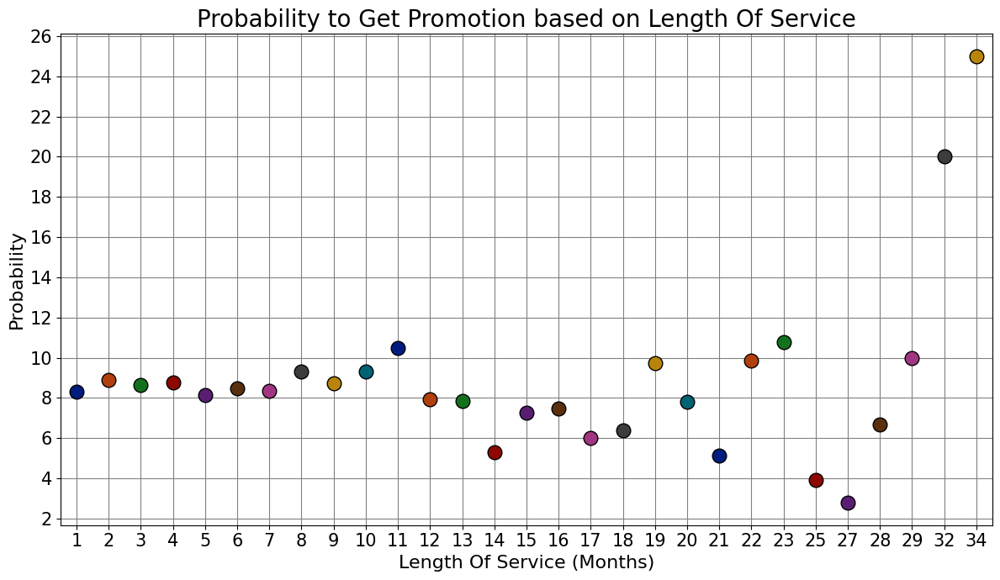

In [38]:
fig, ax = plt.subplots(figsize=(12, 7))

los = sns.stripplot(data=prob_los,
                        x='length_of_service',
                        y='probability',
                        marker='o',
                        size=12,
                        jitter=True,  
                        palette='dark',
                        edgecolor='black',
                        linewidth=1
                        )

ax.xaxis.grid(True, color='gray')
ax.yaxis.grid(True, color='gray')
plt.xticks(rotation=0, fontsize=15)
ax.set_yticks(np.arange(2.0, 27.0, 2))
plt.yticks(fontsize=15)
plt.title('Probability to Get Promotion based on Length Of Service', fontsize=20)
plt.xlabel('Length Of Service (Months)', fontsize=16)
plt.ylabel('Probability', fontsize=16)
plt.tight_layout()

### Probability to Get Promoted based on Key Performance Indicators Met > 80%

In [39]:
prob_kpi = df.groupby(['KPIs_met >80%', 'is_promoted'])['employee_id'].count().reset_index()

prob_kpi = prob_kpi.pivot_table(index='KPIs_met >80%',
                                columns='is_promoted',
                                values='employee_id').reset_index()

prob_kpi.columns = ['KPIs_met >80%', 'non-promoted', 'promoted']

prob_kpi['total_emp'] = prob_kpi['non-promoted'] + prob_kpi['promoted']

prob_kpi['probability'] = np.round((prob_kpi['promoted'] / prob_kpi['total_emp']) * 100, 2)

prob_kpi = prob_kpi.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_kpi

,KPIs_met >80%,non-promoted,promoted,total_emp,probability
0,1,16029,3262,19291,16.91
1,0,34111,1406,35517,3.96


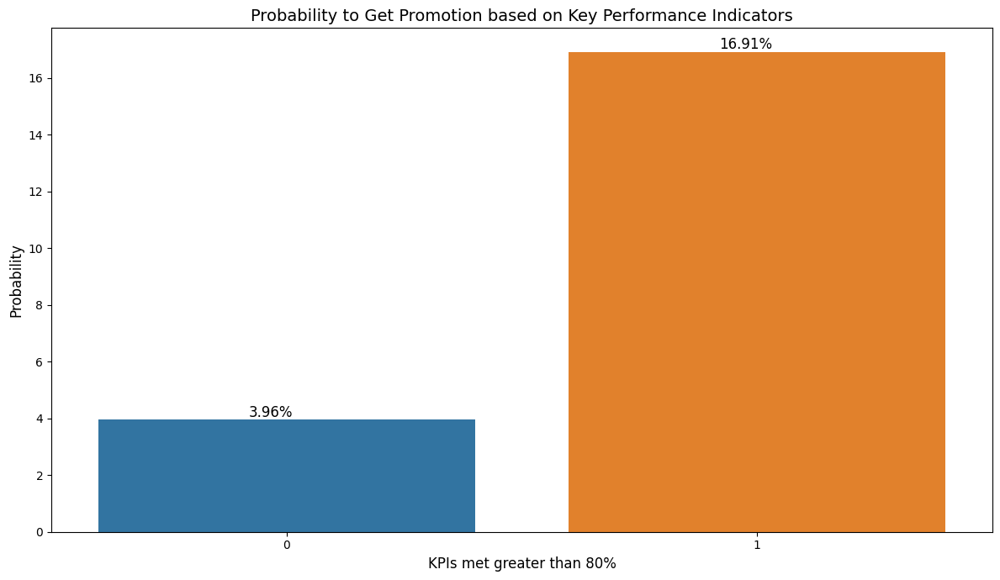

In [40]:
fig, ax = plt.subplots(figsize=(12,7))

kpi = sns.barplot(data=prob_kpi,
                  x='KPIs_met >80%',
                  y='probability')

for p in kpi.patches:
    height = p.get_height()

    plt.text(x=p.get_x() + (p.get_width() / 2.5),
             y=height + 0.1,
             s=f'{height:.2f}%',
             fontsize=12)

plt.title('Probability to Get Promotion based on Key Performance Indicators', fontsize=14)
plt.xlabel('KPIs met greater than 80%', fontsize=12)
plt.ylabel('Probability', fontsize=12)
plt.tight_layout()

### Probability to Get Promotion based on awards_won?

In [41]:
prob_aw = df.groupby(['awards_won?', 'is_promoted'])['employee_id'].count().reset_index()

prob_aw = prob_aw.pivot_table(index='awards_won?',
                              columns='is_promoted',
                              values='employee_id').reset_index()

prob_aw.columns = ['awards_won?', 'non-promoted', 'promoted']

prob_aw['total_emp'] = prob_aw['non-promoted'] + prob_aw['promoted'] 

prob_aw['probability'] = np.round((prob_aw['promoted'] / prob_aw['total_emp']) * 100, 2)

prob_aw = prob_aw.sort_values(by='probability', ascending=False).reset_index(drop=True)

prob_aw

,awards_won?,non-promoted,promoted,total_emp,probability
0,1,711,559,1270,44.02
1,0,49429,4109,53538,7.67


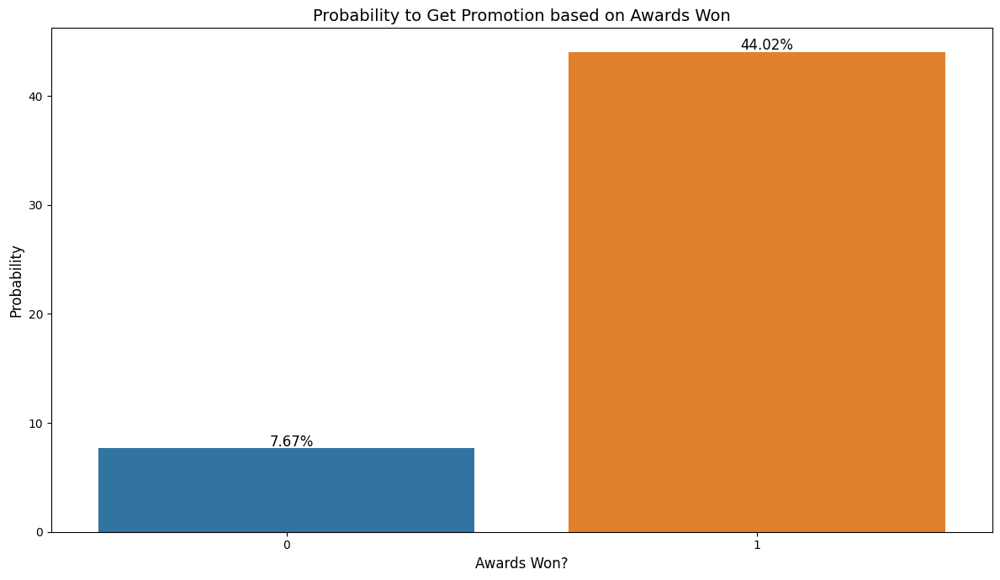

In [42]:
fig, ax = plt.subplots(figsize=(12, 7))

aw = sns.barplot(data=prob_aw,
                 x='awards_won?',
                 y='probability')

for p in aw.patches:
    height = p.get_height()

    plt.text(x=p.get_x() + (p.get_width() / 2.2),
             y=height + 0.2,
             s=f'{height:.2f}%',
             fontsize=12)

plt.title('Probability to Get Promotion based on Awards Won', fontsize=14)
plt.xlabel('Awards Won?', fontsize=12)
plt.ylabel('Probability', fontsize=12)
plt.tight_layout()

### Distribution & Probability of Promoted Employees based on AVG Training Score

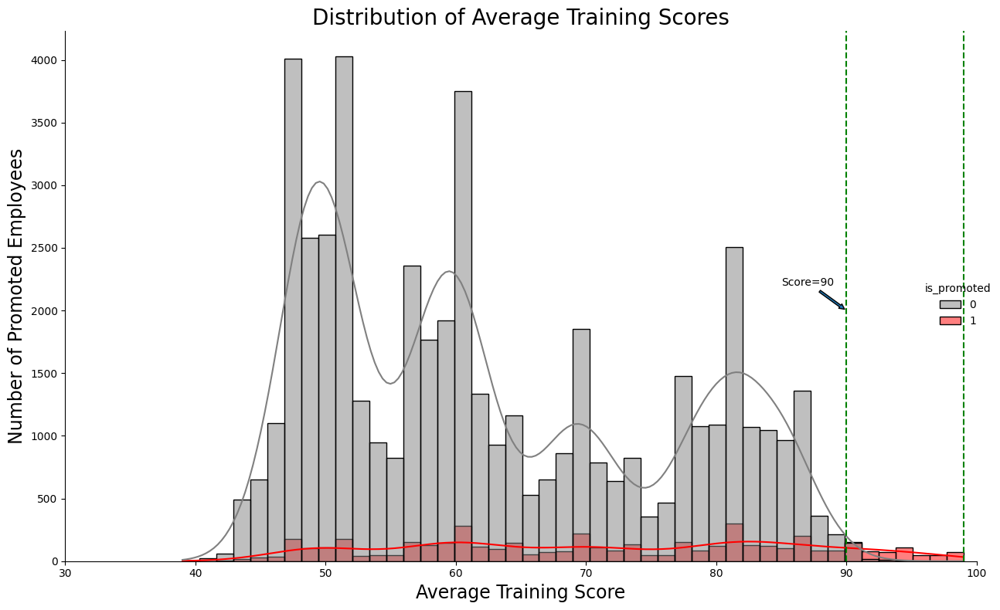

In [43]:
dist_score = sns.displot(data=df,
                  x= 'avg_training_score',
                  hue= 'is_promoted',
                  kde= True,
                  height= 8, 
                  aspect= 1.5,
                  palette={0: 'gray', 1: 'red'})

plt.title('Distribution of Average Training Scores', fontsize = 20)

plt.xlim(30, 100)

plt.axvline(x=90, ls='--', color='green')
plt.axvline(x=99, ls='--', color='green')

plt.annotate(xy=(90, 2000), 
             xytext=(85,2200), 
             text='Score=90',
             arrowprops= dict(ec= 'black',
                              arrowstyle= 'simple'))

plt.xlabel('Average Training Score', fontsize = 17)
plt.ylabel('Number of Promoted Employees', fontsize = 17)

plt.tight_layout()

In [44]:
prob_score = df.groupby(['avg_training_score', 'is_promoted'])['employee_id'].count().reset_index()

prob_score = prob_score.pivot_table(index= 'avg_training_score',
                      columns= 'is_promoted',
                      values= 'employee_id').reset_index()

prob_score.columns = ['avg_training_score', 'non-promoted', 'promoted']

prob_score['non-promoted'] = prob_score['non-promoted'].fillna(0)

prob_score['promoted'] = prob_score['promoted'].fillna(0)

prob_score['total_emp'] = prob_score['non-promoted'] + prob_score['promoted']

prob_score['percentage'] = np.round((prob_score['promoted'] / prob_score['total_emp']) * 100, 2)

prob_score['score >90'] = np.where(prob_score['avg_training_score']>=90, 'high_score', 'low_score')



In [45]:
csf_score = prob_score.groupby(['score >90'])['promoted','total_emp'].sum().reset_index()

csf_score['percentage'] = np.round((csf_score['promoted'] / csf_score['total_emp']) * 100, 2)

csf_score

,score >90,promoted,total_emp,percentage
0,high_score,587.0,764.0,76.83
1,low_score,4081.0,54044.0,7.55


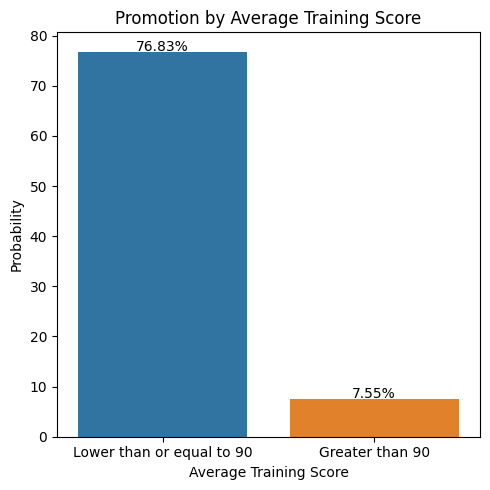

In [46]:
fig, ax = plt.subplots(figsize=(5,5))

score = sns.barplot(data= csf_score,
                      x= 'score >90',
                      y= 'percentage',
                      ax= ax)

for p in score.patches:
    height = p.get_height()
    
    plt.text(x= p.get_x() + (p.get_width() / 2),
             y= height + 0.2,
             s= f'{height:.2f}%',
             ha= 'center')
    
score.set_xticklabels(['Lower than or equal to 90', 'Greater than 90'])
plt.xticks(rotation= 0)
plt.title('Promotion by Average Training Score')
plt.xlabel('Average Training Score')
plt.ylabel('Probability')
plt.tight_layout()

# Data preprairation

## Examining the proportion of missing data

In [47]:
missing_values = df.isnull().sum()
missing_values[missing_values > 0]

education               2409
previous_year_rating    4124
dtype: int64

## The proportion of missing data

In [48]:
missing_percentage = np.round((missing_values / len(df)) * 100, 2)
missing_percentage[missing_percentage > 0.0]

education               4.40
previous_year_rating    7.52
dtype: float64

## Fix missing data

### Fix the missing in value Education

Fix the missing value in education feature with mode() function to fill them with the most frequently occuring values

In [49]:
clean_data = df.copy()

clean_data['education'].value_counts()

Bachelor's          36669
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

In [50]:
clean_data['education'] = clean_data['education'].fillna(clean_data['education'].mode()[0])

clean_data['education'].value_counts()

Bachelor's          39078
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

### Fix the missing value in Previous Year Rating

Fix the missing value in previous_year_rating feature with median() function to fill them with the median values. The reason is the distribution of this feature looks normal (the mean value and median value is close enough)

In [51]:
clean_data['previous_year_rating'].fillna(clean_data['previous_year_rating'].median(), inplace=True)

In [52]:
clean_data.isna().sum()

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
is_promoted             0
dtype: int64

### Feature Engineering


Based on the dataset, I decided to create 4 new features using the data from existing features

1. potential_region: contains the information of whether an employee was placed in potential region to be promoted or not

2. performance_level: contains the information that show the performance level of an employee. This feature comes from combination of previous_year_rating, KPIs_met >80%, and awards_won?

3. High_Avg_Tscore: contains the information of whether the average training score of an employee is high enough for promotion chance based on the previous data

4. male: contains the information to show an employee gender

In [53]:
dcat = clean_data.select_dtypes(include=['object'])
dcat_unique = dcat.nunique().reset_index()
dcat_unique.columns = ['feature', 'unique_value_counts']
dcat_unique = dcat_unique.sort_values(by='unique_value_counts', ascending=False)
dcat_unique

,feature,unique_value_counts
1,region,34
0,department,9
2,education,3
4,recruitment_channel,3
3,gender,2


#### Potential_region

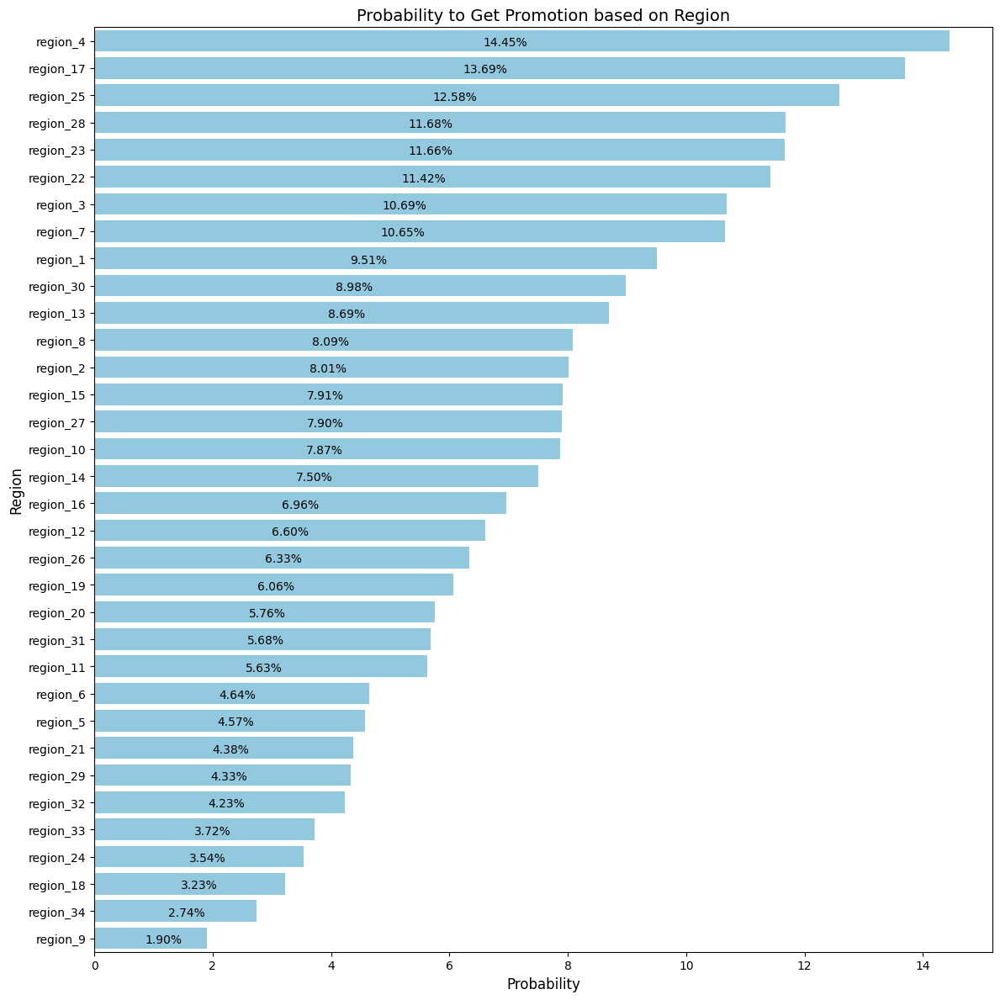

based on the probability information on promoted_by_region, there are 8 regions that have a higher potential than other regions, namely with a probability value 10%

In [54]:
clean_data['potential_region'] = np.where(clean_data['region'].isin(['region_4', 'region_17',
                                                                  'region_25', 'region_28',
                                                                  'region_23', 'region_3',
                                                                  'region_7']), 1, 0)
clean_data.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,potential_region
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0,1
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0,1
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0,0


In [55]:
p_reg_prob = (
    clean_data.groupby(['potential_region', 'is_promoted'])
    .size()
    .unstack(fill_value=0)
    .reset_index()
    .rename(columns={'potential_region': 'potential_region', 0: 'non-promoted', 1: 'promoted'})
)

p_reg_prob['total_employees'] = p_reg_prob['non-promoted'] + p_reg_prob['promoted']

p_reg_prob['promotion_probs'] = (p_reg_prob['promoted'] / p_reg_prob['total_employees']) * 100

p_reg_prob['potential_region'] = np.where(p_reg_prob['potential_region'] == 1, 'YES', 'NO')

p_reg_prob = p_reg_prob.sort_values('promotion_probs', ascending=False).reset_index(drop=True)

p_reg_prob

is_promoted,potential_region,non-promoted,promoted,total_employees,promotion_probs
0,YES,9698,1302,11000,11.836364
1,NO,40442,3366,43808,7.683528


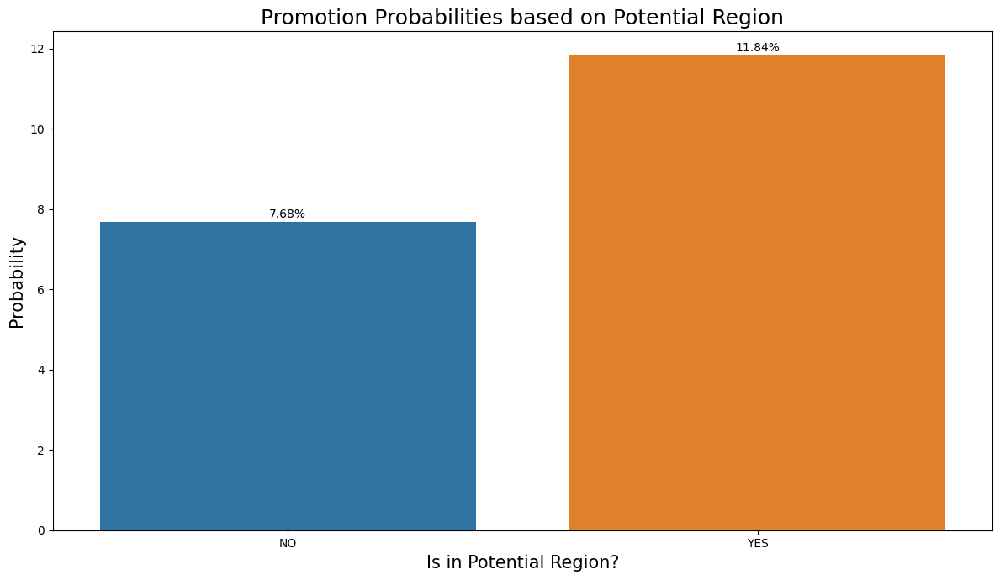

In [56]:
fig, ax = plt.subplots(figsize=(12, 7))

p_reg = sns.barplot(data= p_reg_prob,
                    x='potential_region',
                    y='promotion_probs',
                    order=p_reg_prob.sort_values('promotion_probs')['potential_region'])

for p in p_reg.patches:
    height = p.get_height()
    
    plt.text(x=p.get_x() + (p.get_width() / 2),
             y= height + 0.1,
             s=f'{height:.2f}%',
             ha='center')

plt.title('Promotion Probabilities based on Potential Region', fontsize=18)
plt.xlabel('Is in Potential Region?', fontsize = 15)
plt.ylabel('Promotion Probabilities', fontsize = 15) 
plt.ylabel('Probability')
plt.tight_layout()    

#### Performance_level

This feature comes from combination of previous_year_rating, KPIs_met >80%, and awards_won?

<b>Based on the probability obtained in promoted_by_kpi, previous_year_rating, and awards_won? have been shown that the probability will be higher if an employee met this 3 conditions:</b>

1. An employee who met their KPI > 80 % has higher chance to get promotion than others who didn't met their KPI
2. An employee who got 5 rating in the previous year has 9% higher chance to get promoted than others
3. An employee who won any award in the previous year has 36% higher chance to get promotion thanothers

<b>This feature will have performance level as its value, from 1 (low) to 4 (best), with the provisions below:</b>

- if KPIs_met = 1 & rating = 5 & awards_won = 1, then 4 (Best)
- if KPIs_met = 1 & rating = 4/5 & awards_won = 1/0, then 3 (Better)
- if KPIs_met = 1 & rating = 3 & awards_won = 1/0, then 2 (Good)
- else 1 (Low)

In [57]:
clean_data['performance_level'] = 'Low'

conditions = [
    (clean_data['previous_year_rating'] == 5) & (clean_data['KPIs_met >80%'] == 1) & (clean_data['awards_won?'] == 1),
    (
        ((clean_data['previous_year_rating'] == 4) & (clean_data['KPIs_met >80%'] == 0) & (clean_data['awards_won?'] == 1)) |
        ((clean_data['previous_year_rating'] == 4) & (clean_data['KPIs_met >80%'] == 1) & (clean_data['awards_won?'] == 0)) |
        ((clean_data['previous_year_rating'] == 4) & (clean_data['KPIs_met >80%'] == 1) & (clean_data['awards_won?'] == 1)) |
        ((clean_data['previous_year_rating'] == 5) & (clean_data['KPIs_met >80%'] == 0) & (clean_data['awards_won?'] == 1)) |
        ((clean_data['previous_year_rating'] == 5) & (clean_data['KPIs_met >80%'] == 1) & (clean_data['awards_won?'] == 0))
    ),
    (
        ((clean_data['previous_year_rating'] == 3) & (clean_data['KPIs_met >80%'] == 1) & (clean_data['awards_won?'] == 1)) |
        ((clean_data['previous_year_rating'] == 3) & (clean_data['KPIs_met >80%'] == 1) & (clean_data['awards_won?'] == 0)) |
        ((clean_data['previous_year_rating'] == 3) & (clean_data['KPIs_met >80%'] == 0) & (clean_data['awards_won?'] == 1))
    )
]

values = ['Best', 'Better', 'Good']

clean_data['performance_level'] = np.select(conditions, values, default='Low')

clean_data.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,potential_region,performance_level
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0,1,Better
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0,0,Low
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0,0,Low
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0,1,Low
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0,0,Low


In [58]:
perform_prob = (
    clean_data.groupby(['performance_level', 'is_promoted'])
    .size()
    .unstack(fill_value=0)
    .reset_index()
)

perform_prob.columns = ['performance_level', 'not_promoted', 'promoted']

perform_prob['total_employees'] = perform_prob['not_promoted'] + perform_prob['promoted']
perform_prob['promotion_probs'] = (perform_prob['promoted'] / perform_prob['total_employees']) * 100

perform_prob = perform_prob.sort_values('promotion_probs', ascending=False).reset_index(drop=True)

perform_prob

,performance_level,not_promoted,promoted,total_employees,promotion_probs
0,Best,114,125,239,52.301255
1,Good,5203,1232,6435,19.145299
2,Better,9460,1953,11413,17.112065
3,Low,35363,1358,36721,3.698156


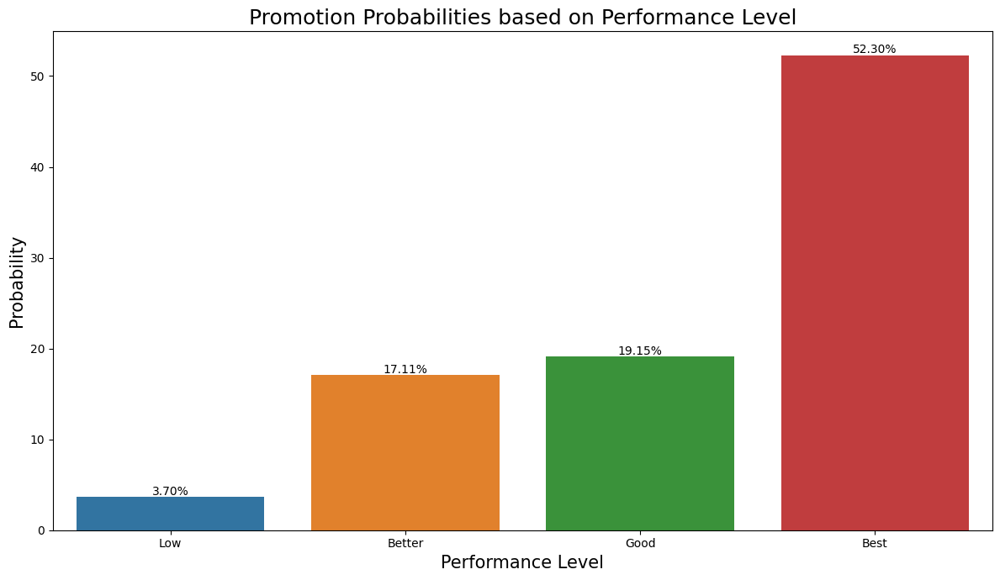

In [59]:
fig, ax = plt.subplots(figsize=(12, 7))

performace = sns.barplot(data= perform_prob,
                    x='performance_level',
                    y='promotion_probs',
                    order=perform_prob.sort_values('promotion_probs')['performance_level'])

for p in performace.patches:
    height = p.get_height()
    
    plt.text(x=p.get_x() + (p.get_width() / 2),
             y= height + 0.2,
             s=f'{height:.2f}%',
             ha='center')

plt.title('Promotion Probabilities based on Performance Level', fontsize=18)
plt.xlabel('Performance Level', fontsize = 15)
plt.ylabel('Promotion Probabilities', fontsize = 15) 
plt.ylabel('Probability')
plt.tight_layout()    

#### High_Avg_Tscore

This feature will have information on whether an employee has an average training score of more than or equal to 90 which has a greater chance of getting a promotion.

1. based on the probability information on avg_training_score, the opportunity for employees with a value greater than 90 is 76.83%

2. If the employee has this value then the value is '1' otherwise it will be worth '0'

In [60]:
clean_data['High_Avg_Tscore'] = np.where(clean_data['avg_training_score'] >= 90, 1, 0)

clean_data.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,potential_region,performance_level,High_Avg_Tscore
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0,1,Better,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0,0,Low,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0,0,Low,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0,1,Low,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0,0,Low,0


#### male

Contains the information to show an employee gender from gender feature

1. If the gender value is m, male feature will have value 1, if not the value will be set to 0

2. This is to reduce the feature encoding results that may be affect the number of feature

In [61]:
clean_data['male'] = np.where(clean_data['gender'] == 'm', 1, 0)

clean_data.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,potential_region,performance_level,High_Avg_Tscore,male
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0,1,Better,0,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0,0,Low,0,1
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0,0,Low,0,1
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0,1,Low,0,1
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0,0,Low,0,1


### Feature Encoding

In [62]:
dmies_dept = pd.get_dummies(clean_data['department'], prefix='Dept')
clean_data = pd.concat([clean_data, dmies_dept], axis=1)

In [63]:
dmies_edu = pd.get_dummies(clean_data['education'])
clean_data = pd.concat([clean_data, dmies_edu], axis=1)

In [64]:
dmies_rc = pd.get_dummies(clean_data['recruitment_channel'])
clean_data = pd.concat([clean_data, dmies_rc], axis=1)

In [65]:
dmies_pl = pd.get_dummies(clean_data['performance_level'])
clean_data = pd.concat([clean_data, dmies_pl], axis=1)

In [66]:
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   employee_id             54808 non-null  int64  
 1   department              54808 non-null  object 
 2   region                  54808 non-null  object 
 3   education               54808 non-null  object 
 4   gender                  54808 non-null  object 
 5   recruitment_channel     54808 non-null  object 
 6   no_of_trainings         54808 non-null  int64  
 7   age                     54808 non-null  int64  
 8   previous_year_rating    54808 non-null  float64
 9   length_of_service       54808 non-null  int64  
 10  KPIs_met >80%           54808 non-null  int64  
 11  awards_won?             54808 non-null  int64  
 12  avg_training_score      54808 non-null  int64  
 13  is_promoted             54808 non-null  int64  
 14  potential_region        54808 non-null

## Logarithms

Use Logarithms to reduce the size of the data

In [67]:
features = [
    'no_of_trainings',
    'age',
    'previous_year_rating',
    'length_of_service',
    'KPIs_met >80%',
    'awards_won?',
    'avg_training_score',
    'is_promoted',
    'potential_region',
    'Dept_Analytics',
    'Dept_Finance',
    'Dept_HR',
    'Dept_Legal',
    'Dept_Operations',
    'Dept_Procurement',
    'Dept_R&D',
    'Dept_Sales & Marketing',
    'Dept_Technology',
    "Bachelor's",
    'Below Secondary',
    "Master's & above", 
    'other',
    'referred',
    'sourcing',
    'male',
    'High_Avg_Tscore',
    'Best',
    'Better',
    'Good',
    'Low'
]

pre_df = clean_data.copy()

for var in features:
    pre_df['log_' + var] = (clean_data[var] + 1).apply(np.log)

In [68]:
pre_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 67 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   employee_id                 54808 non-null  int64  
 1   department                  54808 non-null  object 
 2   region                      54808 non-null  object 
 3   education                   54808 non-null  object 
 4   gender                      54808 non-null  object 
 5   recruitment_channel         54808 non-null  object 
 6   no_of_trainings             54808 non-null  int64  
 7   age                         54808 non-null  int64  
 8   previous_year_rating        54808 non-null  float64
 9   length_of_service           54808 non-null  int64  
 10  KPIs_met >80%               54808 non-null  int64  
 11  awards_won?                 54808 non-null  int64  
 12  avg_training_score          54808 non-null  int64  
 13  is_promoted                 548

In [69]:
pre_df.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,potential_region,...,log_Master's & above,log_other,log_referred,log_sourcing,log_male,log_High_Avg_Tscore,log_Best,log_Better,log_Good,log_Low
count,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,...,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.304481,5.865512,0.351974,0.023172,63.386750,0.085170,0.200701,...,0.188721,0.384766,0.014450,0.293701,0.486852,0.009662,0.003023,0.144409,0.081360,0.464355
std,22586.581449,0.609264,7.660169,1.214770,4.265094,0.477590,0.150450,13.371559,0.279137,0.400528,...,0.308594,0.344482,0.098999,0.342529,0.316918,0.081265,0.045715,0.281494,0.223145,0.325928
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000,0.000000,...,0.000000,0.693359,0.000000,0.000000,0.693147,0.000000,0.000000,0.000000,0.000000,0.693359
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000,0.000000,...,0.693359,0.693359,0.000000,0.693359,0.693147,0.000000,0.000000,0.000000,0.000000,0.693359
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000,1.000000,...,0.693359,0.693359,0.693359,0.693359,0.693147,0.693147,0.693359,0.693359,0.693359,0.693359


## Normalization

In [70]:
from sklearn.preprocessing import MinMaxScaler

In [71]:
for var in features:
    pre_df['nor_' + var] = MinMaxScaler().fit_transform(pre_df[var].values.reshape(len(pre_df),1))

In [72]:
pre_df

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,...,nor_Master's & above,nor_other,nor_referred,nor_sourcing,nor_male,nor_High_Avg_Tscore,nor_Best,nor_Better,nor_Good,nor_Low
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
54806,13614,Sales & Marketing,region_9,Bachelor's,m,sourcing,1,29,1.0,2,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0


# Machine Learning Modelling and Evaluation

In [73]:
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_curve
import pickle

# Define function for roc auc curve
def plot_roc_curve(fpr, tpr, label=None):
    plt.figure(figsize=(8,8))
    plt.title('ROC Curve')
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.005, 1, 0, 1.005])
    plt.xticks(np.arange(0,1, 0.05), rotation=90)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate (Recall)")
    plt.legend(loc='best')

#Define function to see precision and recall threshold
def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
    plt.figure(figsize=(8, 8))
    plt.title("Precision and Recall Scores as a function of the decision threshold")
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
    plt.ylabel("Score")
    plt.xlabel("Decision Threshold")
    plt.legend(loc='best')

# Define function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()

## Split Train & Test

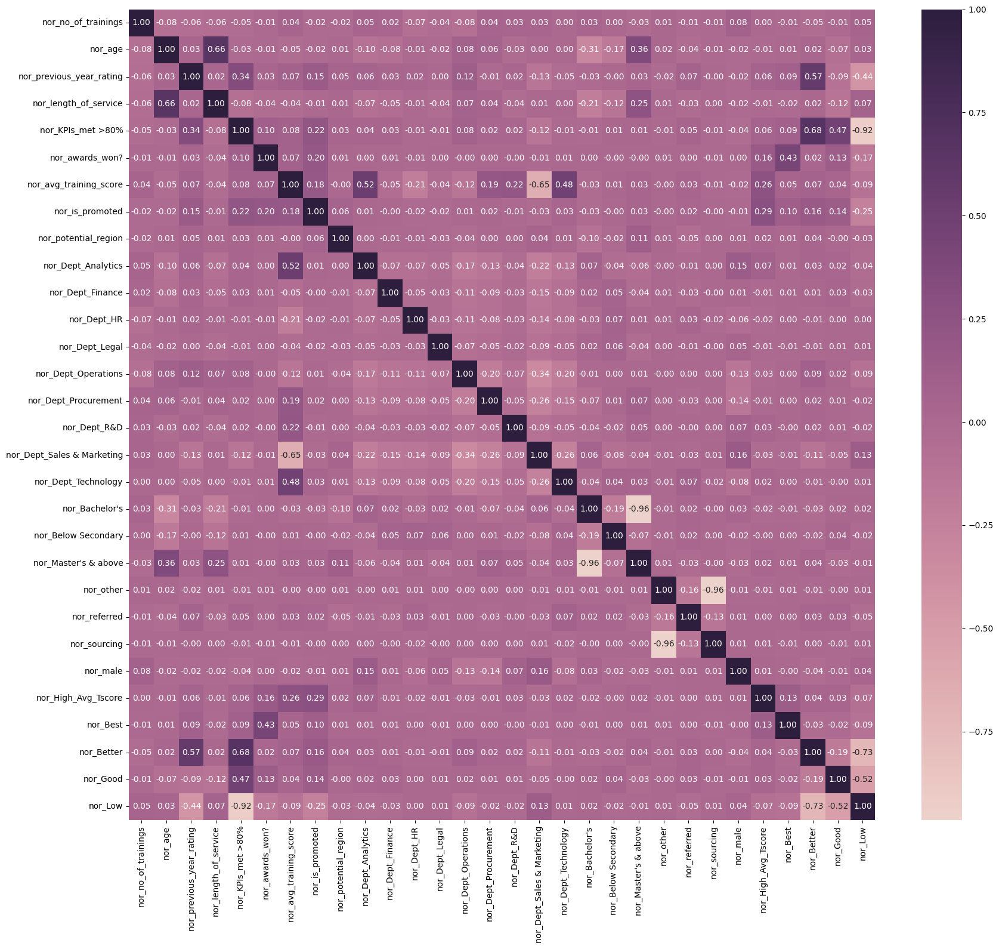

In [74]:
plt.figure(figsize=(18, 16))
sns.heatmap(
        pre_df[
                ['nor_no_of_trainings',
                'nor_age',
                'nor_previous_year_rating',
                'nor_length_of_service',
                'nor_KPIs_met >80%',
                'nor_awards_won?',
                'nor_avg_training_score',
                'nor_is_promoted',
                'nor_potential_region',
                'nor_Dept_Analytics',
                'nor_Dept_Finance',
                'nor_Dept_HR',
                'nor_Dept_Legal',
                'nor_Dept_Operations',
                'nor_Dept_Procurement',
                'nor_Dept_R&D',
                'nor_Dept_Sales & Marketing',
                'nor_Dept_Technology',
                "nor_Bachelor's",
                'nor_Below Secondary',
                "nor_Master's & above", 
                'nor_other',
                'nor_referred',
                'nor_sourcing',
                'nor_male',
                'nor_High_Avg_Tscore',
                'nor_Best',
                'nor_Better',
                'nor_Good',
                'nor_Low']
        ].corr(), 
    annot=True,
    fmt= '.2f',
    cmap= sns.cubehelix_palette(as_cmap=True)
)

plt.tight_layout()

In [75]:
x_nor = pre_df[
                ['nor_no_of_trainings',
                 'nor_age',
                 'nor_previous_year_rating',
                 'nor_length_of_service',
                 'nor_KPIs_met >80%',
                 'nor_awards_won?',
                 'nor_avg_training_score',
                 'nor_potential_region',
                 'nor_Dept_Analytics',
                 'nor_Dept_Finance',
                 'nor_Dept_HR',
                 'nor_Dept_Legal',
                 'nor_Dept_Operations',
                 'nor_Dept_Procurement',
                 'nor_Dept_R&D',
                 'nor_Dept_Sales & Marketing',
                 'nor_Dept_Technology',
                 "nor_Bachelor's",
                 'nor_Below Secondary',
                 "nor_Master's & above", 
                 'nor_other',
                 'nor_referred',
                 'nor_sourcing',
                 'nor_male',
                 'nor_High_Avg_Tscore',
                 'nor_Best',
                 'nor_Better',
                 'nor_Good',
                 'nor_Low']]

y_nor = pre_df['nor_is_promoted']

In [76]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x_nor, y_nor, test_size=0.2, random_state=42)

In [77]:
print(pre_df.shape, X_train.shape, X_test.shape)

(54808, 97) (43846, 29) (10962, 29)


## Random Forest

Classification Report
              precision    recall  f1-score   support

         0.0       0.94      0.99      0.97     10054
         1.0       0.73      0.33      0.46       908

    accuracy                           0.93     10962
   macro avg       0.84      0.66      0.71     10962
weighted avg       0.92      0.93      0.92     10962

- ROC AUC:   66.1 %
- Precision: 72.8 %
- Recall:    33.4 %
- Accuracy:  93.5 %
- F1-Score:  45.8 %


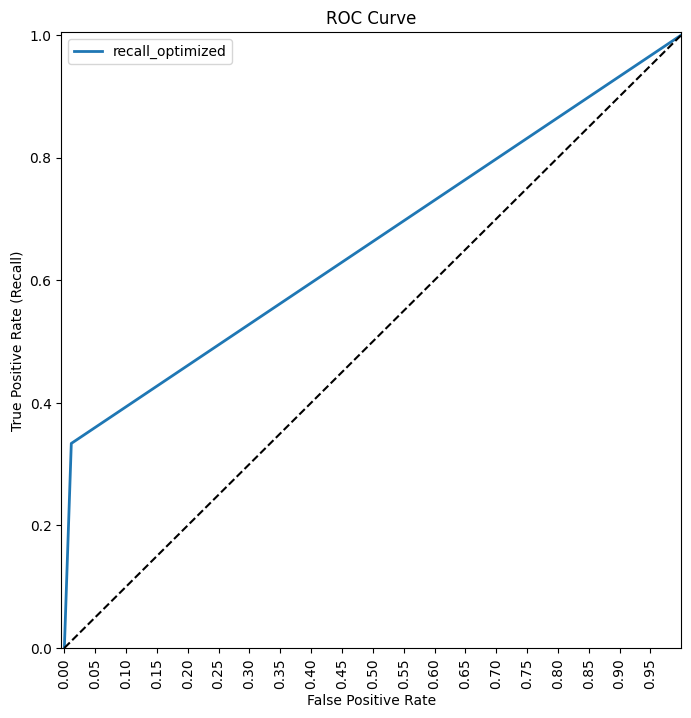

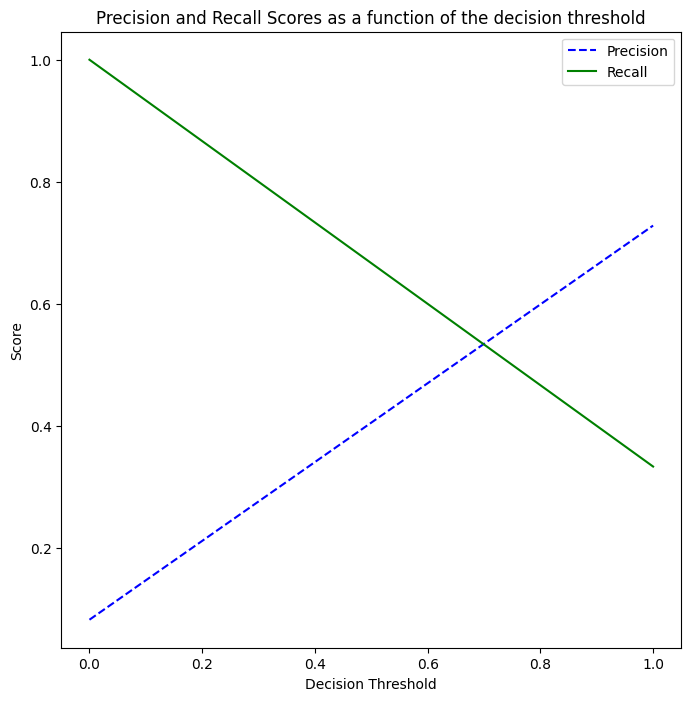

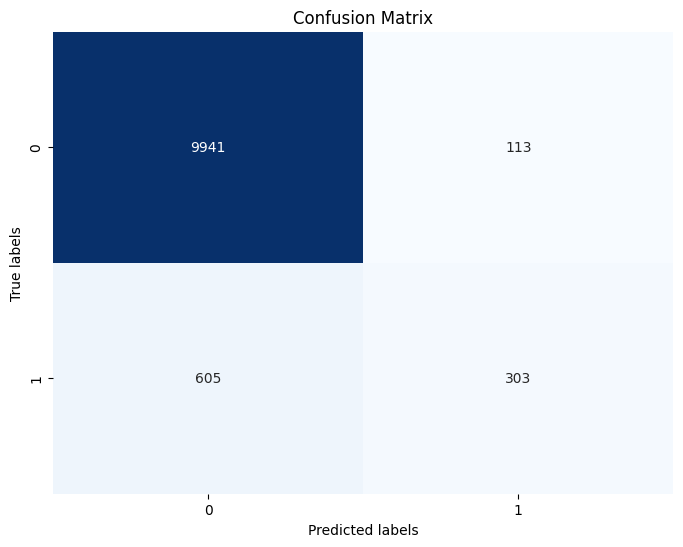

In [78]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)
rf_model = rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

print('Classification Report')
print(classification_report(y_test, y_pred))

print(f'- ROC AUC:   {round(roc_auc_score(y_test, y_pred) * 100, 1)} %')
print(f'- Precision: {round(precision_score(y_test, y_pred)*100,1)} %')
print(f'- Recall:    {round(recall_score(y_test, y_pred)*100,1)} %')
print(f'- Accuracy:  {round(accuracy_score(y_test, y_pred)*100,1)} %')
print(f'- F1-Score:  {round(f1_score(y_test, y_pred)*100,1)} %')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr, 'recall_optimized')

p, r, thresholds = precision_recall_curve(y_test, y_pred)
plot_precision_recall_vs_threshold(p, r, thresholds)

plot_confusion_matrix(y_test, y_pred)

In [79]:
# Save Machine Learning Model
pickle.dump(rf_model, open('RandomForest.pkl', 'wb'))

# Load and print Model score
loaded_model = pickle.load(open('RandomForest.pkl', 'rb'))
result = loaded_model.score(X_test, y_test)
print(f'Model score: {result}')

#print model score to check if the model is overfitting or not
print(f'train score: {np.round(loaded_model.score(X_train, y_train)*100, 2)} %')
print(f'test score:  {np.round(loaded_model.score(X_test, y_test)*100, 2)} %')

Model score: 0.9345010034665208
train score: 99.78 %
test score:  93.45 %


## K-Nearest Neighbors

Classification Report
              precision    recall  f1-score   support

         0.0       0.93      0.99      0.96     10054
         1.0       0.63      0.22      0.32       908

    accuracy                           0.92     10962
   macro avg       0.78      0.60      0.64     10962
weighted avg       0.91      0.92      0.91     10962

- ROC AUC:   60.2 %
- Precision: 63.0 %
- Recall:    21.6 %
- Accuracy:  92.5 %
- F1-Score:  32.2 %


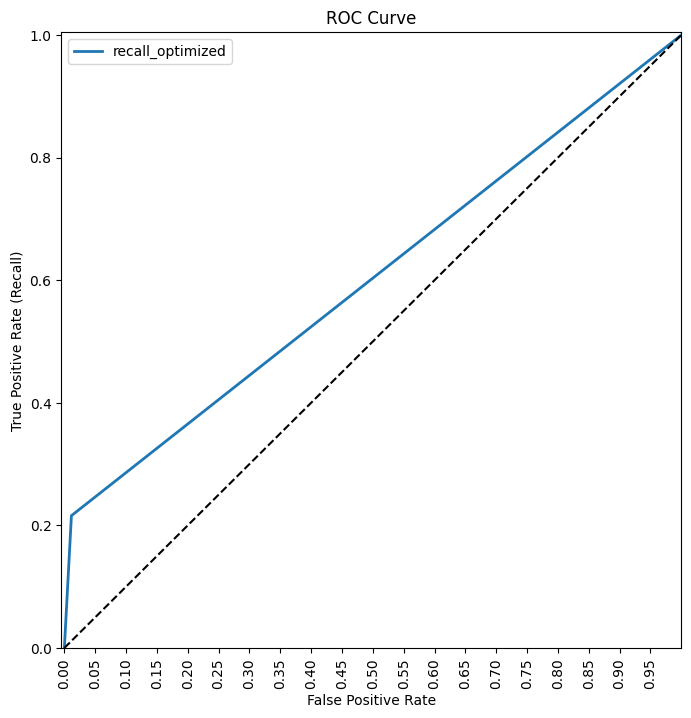

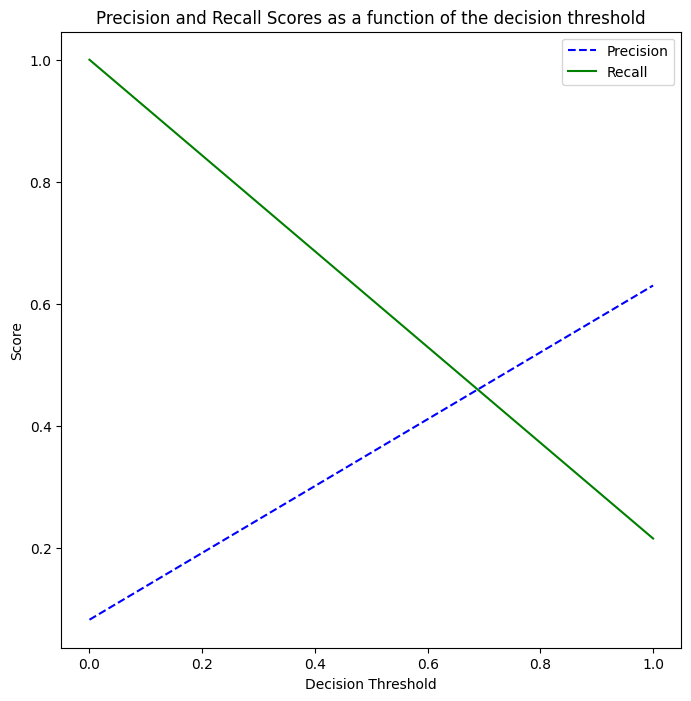

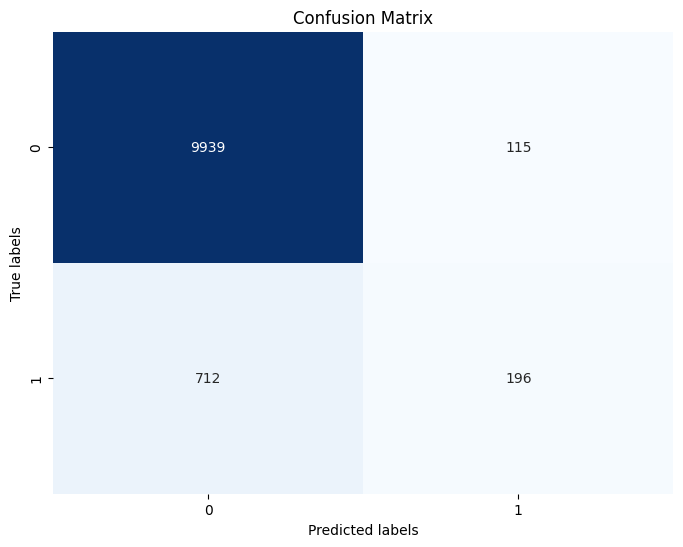

In [80]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
knn_model = knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

print('Classification Report')
print(classification_report(y_test, y_pred))

print(f'- ROC AUC:   {round(roc_auc_score(y_test, y_pred) * 100, 1)} %')
print(f'- Precision: {round(precision_score(y_test, y_pred)*100,1)} %')
print(f'- Recall:    {round(recall_score(y_test, y_pred)*100,1)} %')
print(f'- Accuracy:  {round(accuracy_score(y_test, y_pred)*100,1)} %')
print(f'- F1-Score:  {round(f1_score(y_test, y_pred)*100,1)} %')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr, 'recall_optimized')

p, r, thresholds = precision_recall_curve(y_test, y_pred)
plot_precision_recall_vs_threshold(p, r, thresholds)

plot_confusion_matrix(y_test, y_pred)

In [81]:
# Save Machine Learning Model
pickle.dump(knn_model, open('KNN.pkl', 'wb'))

# Load and print Model score
loaded_model = pickle.load(open('KNN.pkl', 'rb'))
result = loaded_model.score(X_test, y_test)
print(f'Model score: {result}')

#print model score to check if the model is overfitting or not
print(f'train score: {np.round(loaded_model.score(X_train, y_train)*100, 2)} %')
print(f'test score:  {np.round(loaded_model.score(X_test, y_test)*100, 2)} %')

Model score: 0.924557562488597
train score: 93.6 %
test score:  92.46 %


## Logistic Regression

Classification Report
              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97     10054
         1.0       0.86      0.24      0.38       908

    accuracy                           0.93     10962
   macro avg       0.90      0.62      0.67     10962
weighted avg       0.93      0.93      0.92     10962

- ROC AUC:   61.9 %
- Precision: 85.5 %
- Recall:    24.1 %
- Accuracy:  93.4 %
- F1-Score:  37.6 %


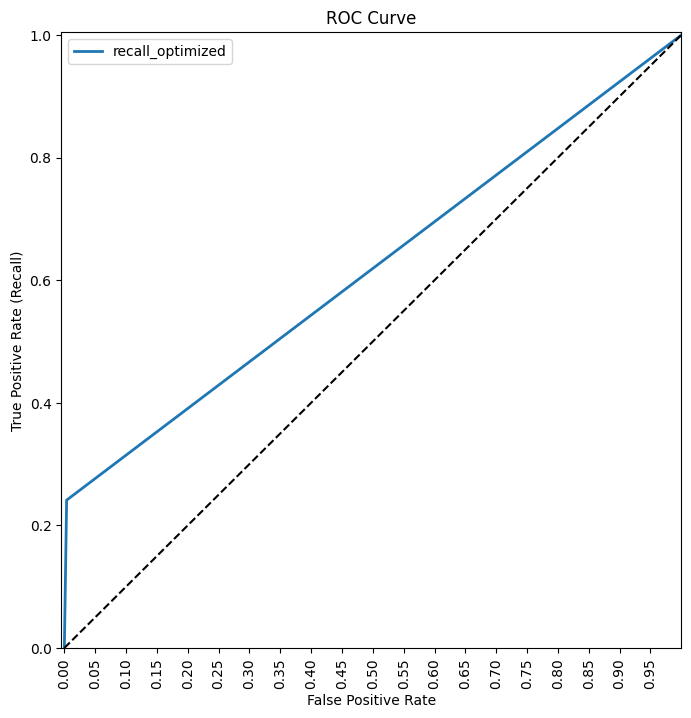

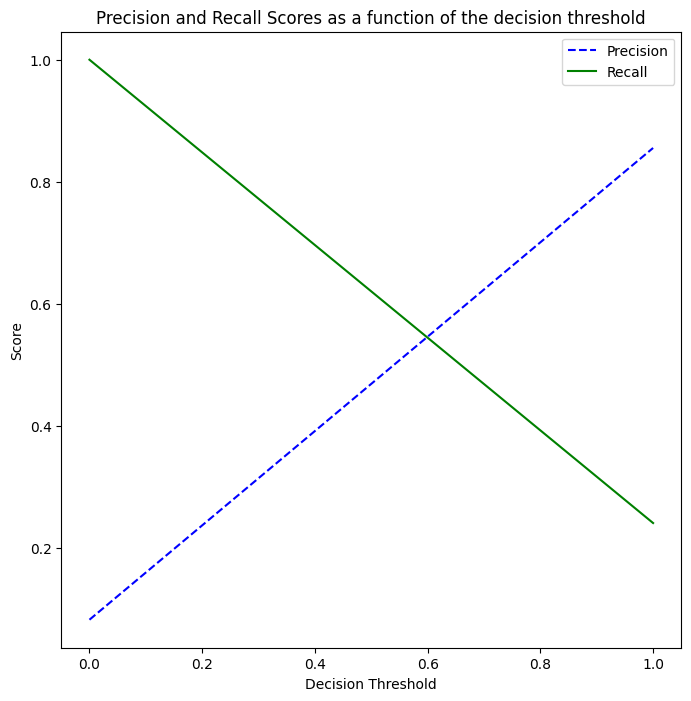

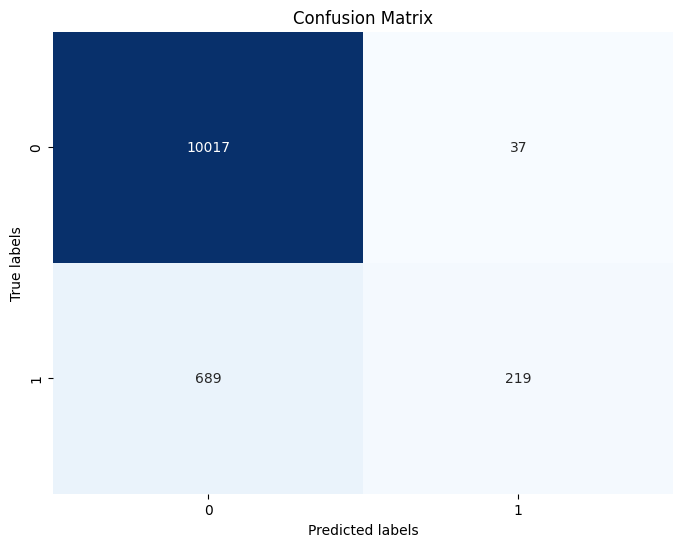

In [82]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(random_state=42, solver='liblinear')
logreg_model = logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

print('Classification Report')
print(classification_report(y_test, y_pred))

print(f'- ROC AUC:   {round(roc_auc_score(y_test, y_pred) * 100, 1)} %')
print(f'- Precision: {round(precision_score(y_test, y_pred)*100,1)} %')
print(f'- Recall:    {round(recall_score(y_test, y_pred)*100,1)} %')
print(f'- Accuracy:  {round(accuracy_score(y_test, y_pred)*100,1)} %')
print(f'- F1-Score:  {round(f1_score(y_test, y_pred)*100,1)} %')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr, 'recall_optimized')

p, r, thresholds = precision_recall_curve(y_test, y_pred)
plot_precision_recall_vs_threshold(p, r, thresholds)

plot_confusion_matrix(y_test, y_pred)

In [83]:
# Save Machine Learning Model
pickle.dump(logreg_model, open('Logreg.pkl', 'wb'))

# Load and print Model score
loaded_model = pickle.load(open('Logreg.pkl', 'rb'))
result = loaded_model.score(X_test, y_test)
print(f'Model score: {result}')

#print model score to check if the model is overfitting or not
print(f'train score: {np.round(loaded_model.score(X_train, y_train)*100, 2)} %')
print(f'test score:  {np.round(loaded_model.score(X_test, y_test)*100, 2)} %')

Model score: 0.9337712096332786
train score: 93.14 %
test score:  93.38 %


## Decision Tree

Classification Report
              precision    recall  f1-score   support

         0.0       0.95      0.94      0.94     10054
         1.0       0.39      0.44      0.42       908

    accuracy                           0.90     10962
   macro avg       0.67      0.69      0.68     10962
weighted avg       0.90      0.90      0.90     10962

- ROC AUC:   69.2 %
- Precision: 39.4 %
- Recall:    44.5 %
- Accuracy:  89.7 %
- F1-Score:  41.8 %


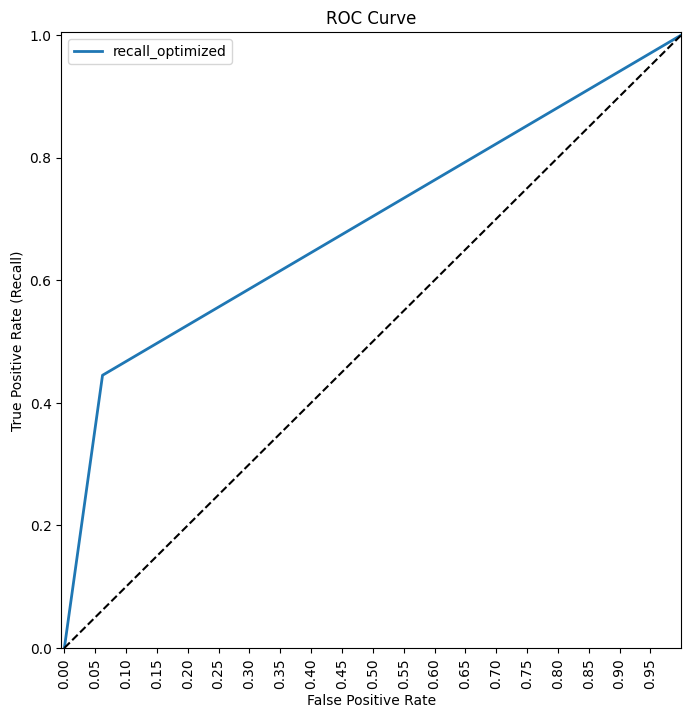

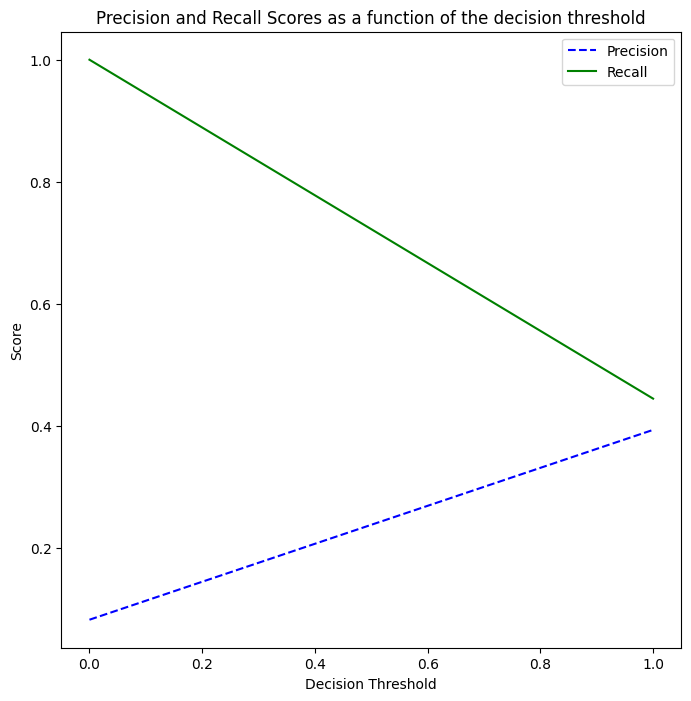

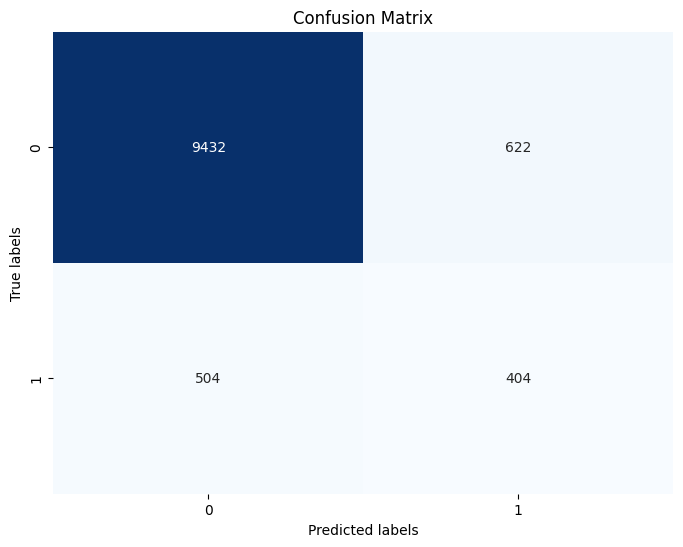

In [84]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=42)
dt_model = dt.fit(X_train,y_train)
y_pred = dt.predict(X_test)

print('Classification Report')
print(classification_report(y_test, y_pred))

print(f'- ROC AUC:   {round(roc_auc_score(y_test, y_pred) * 100, 1)} %')
print(f'- Precision: {round(precision_score(y_test, y_pred)*100,1)} %')
print(f'- Recall:    {round(recall_score(y_test, y_pred)*100,1)} %')
print(f'- Accuracy:  {round(accuracy_score(y_test, y_pred)*100,1)} %')
print(f'- F1-Score:  {round(f1_score(y_test, y_pred)*100,1)} %')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr, 'recall_optimized')

p, r, thresholds = precision_recall_curve(y_test, y_pred)
plot_precision_recall_vs_threshold(p, r, thresholds)

plot_confusion_matrix(y_test, y_pred)

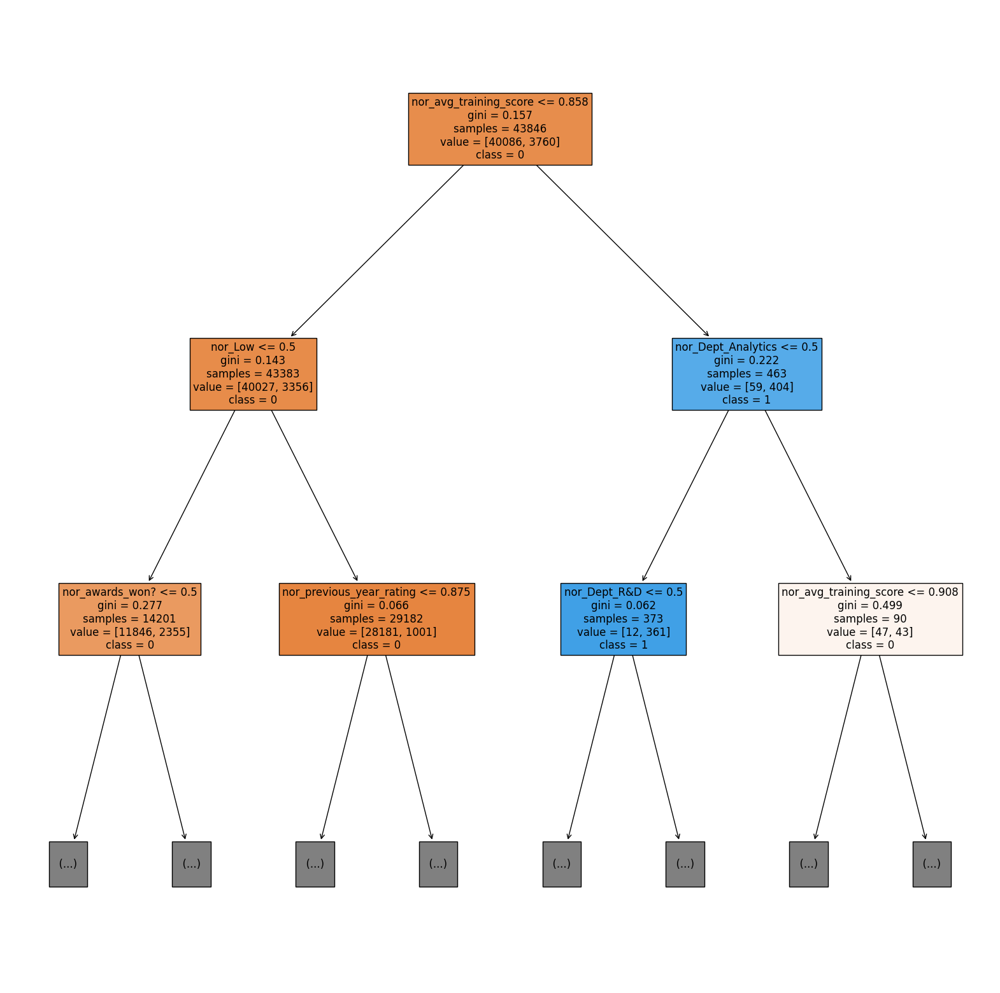

In [85]:
from sklearn import tree

fig, ax = plt.subplots(figsize=(20, 20))
tree.plot_tree(dt,
               feature_names=x_nor.columns.tolist(), 
               class_names=['0','1'],
               filled=True, max_depth=2, fontsize=12)
plt.show()

In [86]:
# Save Machine Learning Model
pickle.dump(dt_model, open('DecisionTree.pkl', 'wb'))

# Load and print Model score
loaded_model = pickle.load(open('DecisionTree.pkl', 'rb'))
result = loaded_model.score(X_test, y_test)
print(f'Model score: {result}')

#print model score to check if the model is overfitting or not
print(f'train score: {np.round(loaded_model.score(X_train, y_train)*100, 2)} %')
print(f'test score:  {np.round(loaded_model.score(X_test, y_test)*100, 2)} %')

Model score: 0.8972815179711732
train score: 99.79 %
test score:  89.73 %


## XGBoost

Classification Report
              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97     10028
         1.0       0.98      0.40      0.57       934

    accuracy                           0.95     10962
   macro avg       0.96      0.70      0.77     10962
weighted avg       0.95      0.95      0.94     10962

- ROC AUC:   70.1 %
- Precision: 97.7 %
- Recall:    40.4 %
- Accuracy:  94.8 %
- F1-Score:  57.1 %


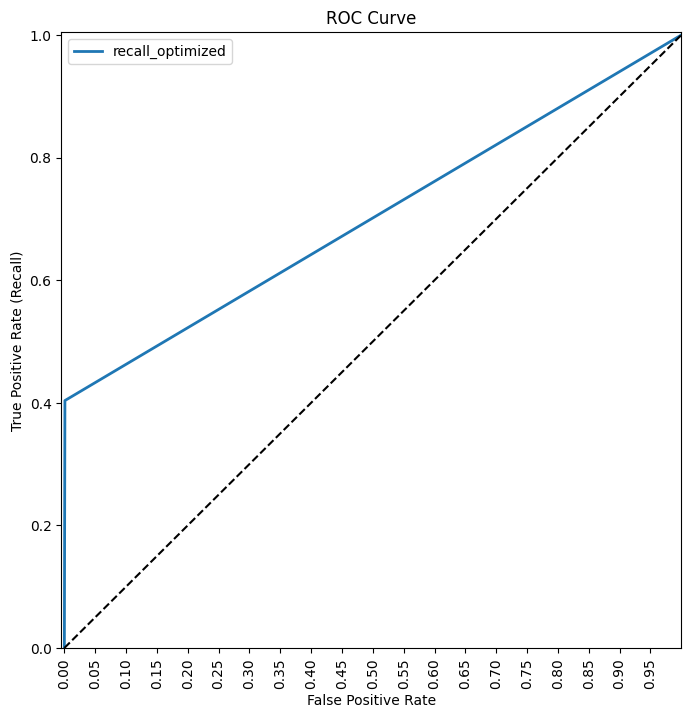

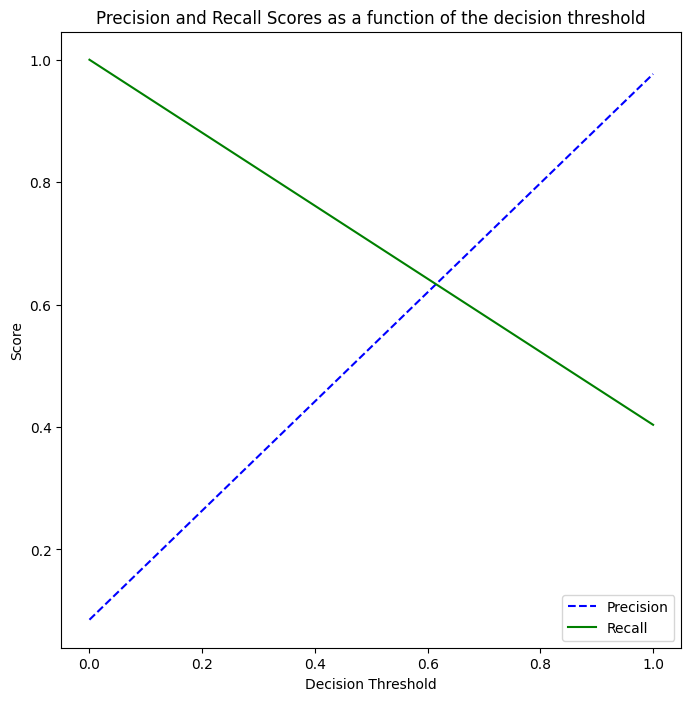

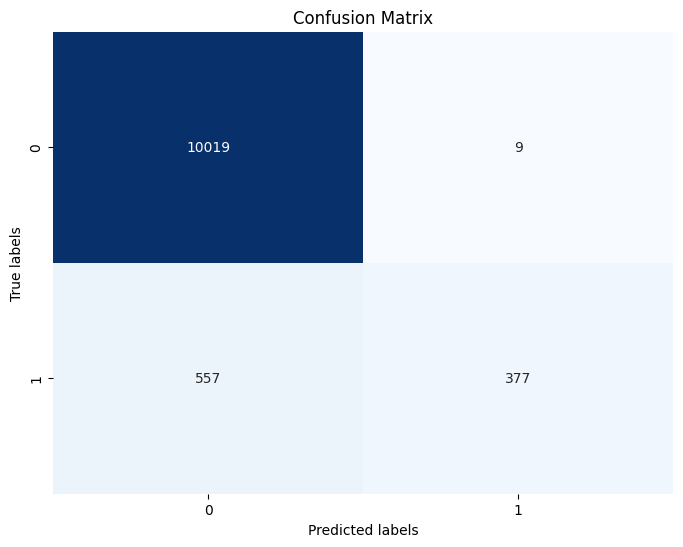

In [87]:
import xgboost as xgb

data_dmatrix = xgb.DMatrix(data=x_nor, label=y_nor)

X_train, X_test, y_train, y_test = train_test_split(x_nor,
                                                y_nor,
                                                test_size=0.2,
                                                shuffle = True,
                                                stratify = y_nor,
                                                random_state=42)

xgb_classifier = xgb.XGBClassifier()
nor_model = xgb_classifier.fit(x_nor, y_nor)
y_pred = nor_model.predict(X_test)
y_pred_train = nor_model.predict(X_train)

print('Classification Report')
print(classification_report(y_test, y_pred))

print(f'- ROC AUC:   {round(roc_auc_score(y_test, y_pred) * 100, 1)} %')
print(f'- Precision: {round(precision_score(y_test, y_pred)*100,1)} %')
print(f'- Recall:    {round(recall_score(y_test, y_pred)*100,1)} %')
print(f'- Accuracy:  {round(accuracy_score(y_test, y_pred)*100,1)} %')
print(f'- F1-Score:  {round(f1_score(y_test, y_pred)*100,1)} %')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr, 'recall_optimized')

p, r, thresholds = precision_recall_curve(y_test, y_pred)
plot_precision_recall_vs_threshold(p, r, thresholds)

plot_confusion_matrix(y_test, y_pred)

In [88]:
# Save Machine Learning Model
pickle.dump(xgb_classifier, open('XGBoost.pkl', 'wb'))

# Load and print Model score
loaded_model = pickle.load(open('XGBoost.pkl', 'rb'))
result = loaded_model.score(X_test, y_test)
print(f'Model score: {result}')

#print model score to check if the model is overfitting or not
print(f'train score: {np.round(loaded_model.score(X_train, y_train)*100, 2)} %')
print(f'test score:  {np.round(loaded_model.score(X_test, y_test)*100, 2)} %')

Model score: 0.9483670862981208
train score: 94.79 %
test score:  94.84 %


# Hyperparameter Tuning

## Random Forest hyperparameter Tuning with Randomized Search

In [89]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

Best n_estimators:      100
Best max_features:      sqrt
Best max_depth:         None
Best min_samples_split: 8
Best min_samples_leaf:  1

Classification Report
              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97     10028
         1.0       0.98      0.40      0.57       934

    accuracy                           0.95     10962
   macro avg       0.96      0.70      0.77     10962
weighted avg       0.95      0.95      0.94     10962

- ROC AUC:   70.1 %
- Precision: 97.7 %
- Recall:    40.4 %
- Accuracy:  94.8 %
- F1-Score:  57.1 %


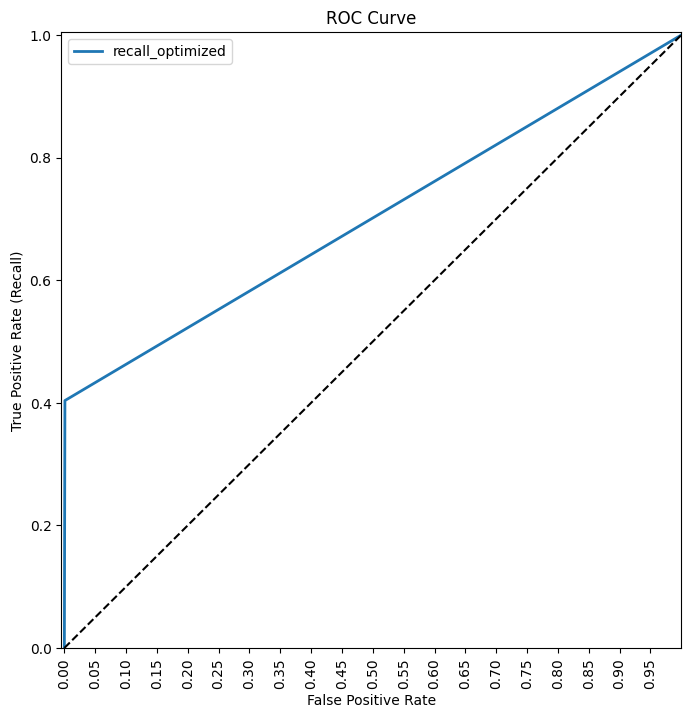

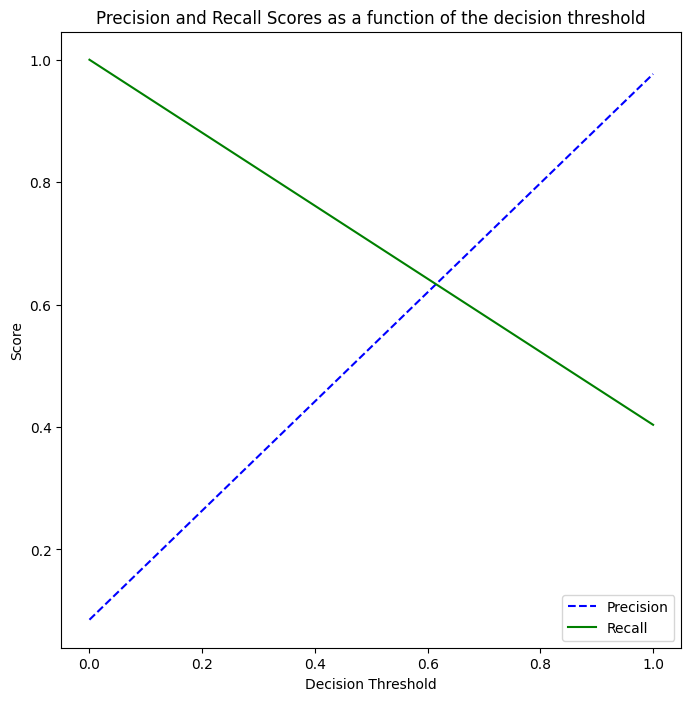

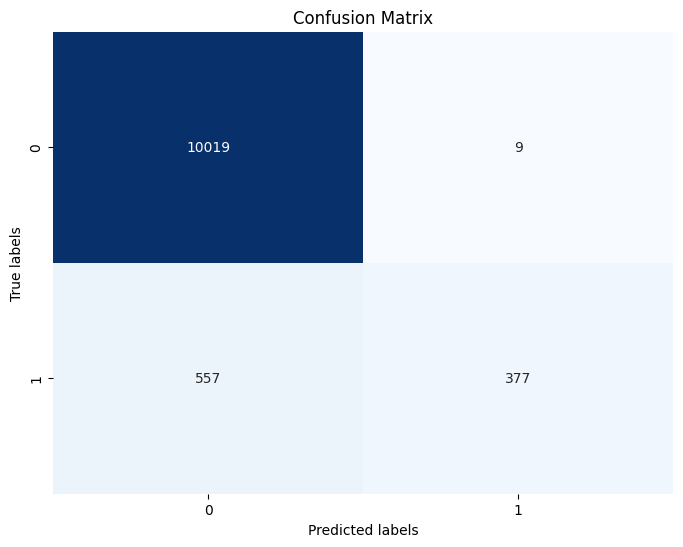

In [90]:
hyperparameters = {
               'min_samples_split': [7,8,9,10],
               'min_samples_leaf': [1,2,3,4,5],
               'bootstrap': [True],
               'n_jobs':[-1]}

rf = RandomForestClassifier(random_state=42)
clf = RandomizedSearchCV(rf, hyperparameters, cv=20, random_state=42)

best_model = clf.fit(X_train,y_train)

print(f'Best n_estimators:      {best_model.best_estimator_.get_params()["n_estimators"]}')
print(f'Best max_features:      {best_model.best_estimator_.get_params()["max_features"]}')
print(f'Best max_depth:         {best_model.best_estimator_.get_params()["max_depth"]}')
print(f'Best min_samples_split: {best_model.best_estimator_.get_params()["min_samples_split"]}')
print(f'Best min_samples_leaf:  {best_model.best_estimator_.get_params()["min_samples_leaf"]}')


print('\nClassification Report')
print(classification_report(y_test, y_pred))
print(f'- ROC AUC:   {round(roc_auc_score(y_test, y_pred) * 100, 1)} %')
print(f'- Precision: {round(precision_score(y_test, y_pred)*100,1)} %')
print(f'- Recall:    {round(recall_score(y_test, y_pred)*100,1)} %')
print(f'- Accuracy:  {round(accuracy_score(y_test, y_pred)*100,1)} %')
print(f'- F1-Score:  {round(f1_score(y_test, y_pred)*100,1)} %')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr, 'recall_optimized')

p, r, thresholds = precision_recall_curve(y_test, y_pred)
plot_precision_recall_vs_threshold(p, r, thresholds)

plot_confusion_matrix(y_test, y_pred)

In [91]:
# Save Machine Learning Model
pickle.dump(best_model, open('RandomForest_model.pkl', 'wb'))

# Load and print Model score
loaded_model = pickle.load(open('RandomForest_model.pkl', 'rb'))
result = loaded_model.score(X_test, y_test)
print(f'Model score: {result}')

#print model score to check if the model is overfitting or not
print(f'train score: {np.round(loaded_model.score(X_train, y_train)*100, 2)} %')
print(f'test score:  {np.round(loaded_model.score(X_test, y_test)*100, 2)} %')

Model score: 0.9391534391534392
train score: 95.22 %
test score:  93.92 %


## Decision Tree Tuning Hyperparameter

Classification Report
              precision    recall  f1-score   support

         0.0       0.93      0.99      0.96     10028
         1.0       0.75      0.18      0.29       934

    accuracy                           0.92     10962
   macro avg       0.84      0.59      0.62     10962
weighted avg       0.91      0.92      0.90     10962

- ROC AUC:   58.6 %
- Precision: 75.0 %
- Recall:    17.7 %
- Accuracy:  92.5 %
- F1-Score:  28.6 %


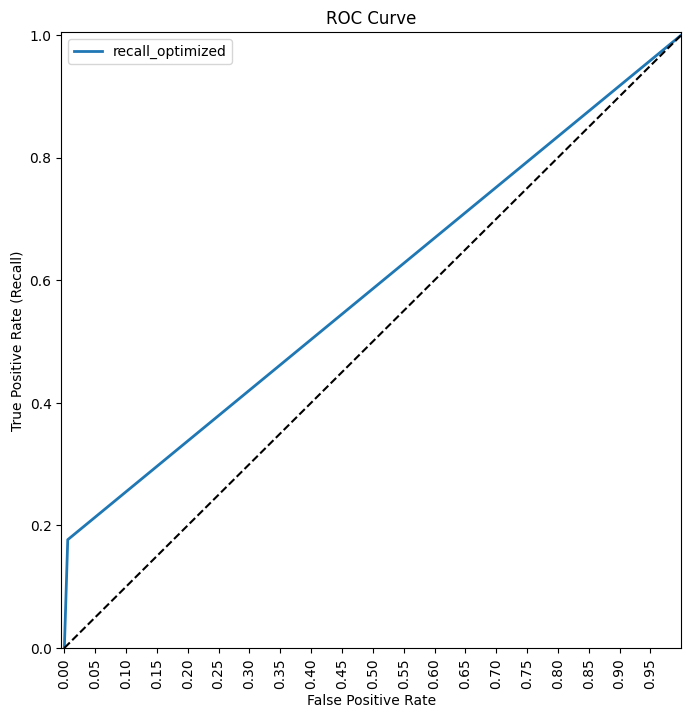

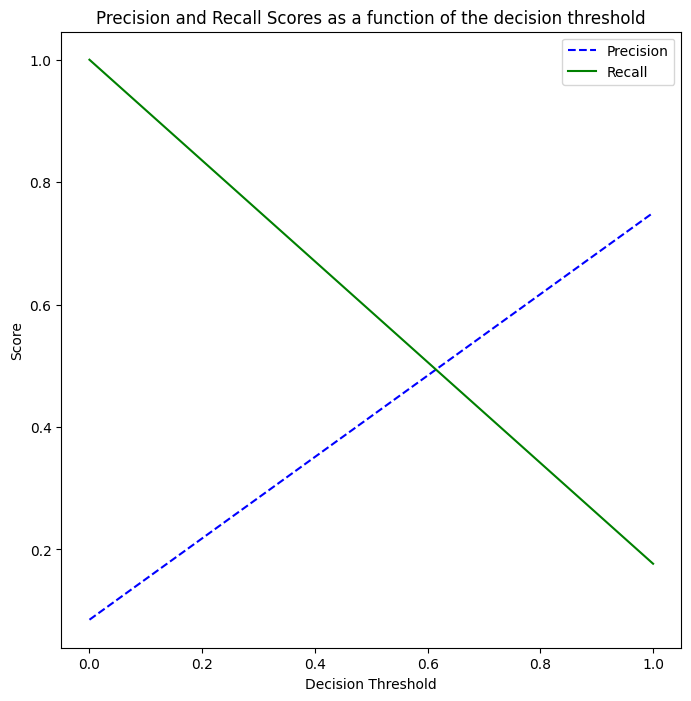

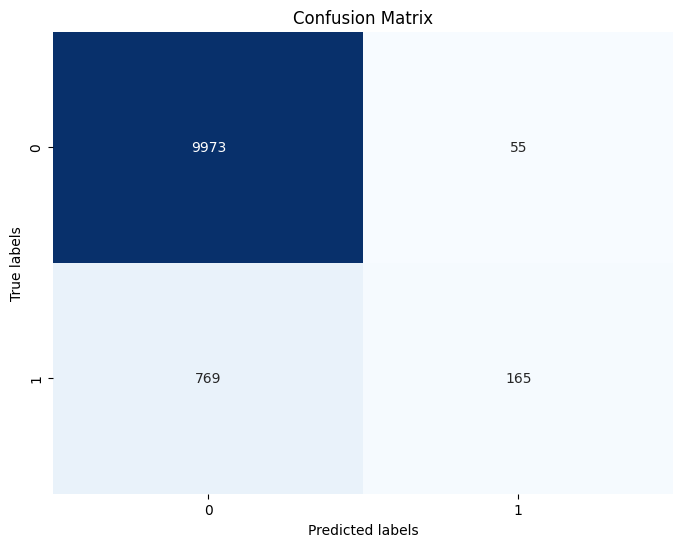

In [92]:
# list of hyperparameter
max_depth = [int(x) for x in np.linspace(1, 110, num = 30)] # Maximum number of levels in tree
min_samples_split = [2, 5, 10, 100] # Minimum number of samples required to split a node
min_samples_leaf = [1, 2, 4, 10, 20, 50] # Minimum number of samples required at each leaf node
max_features = ['auto', 'sqrt'] # Number of features to consider at every split
criterion =['entropy']
splitter = ['random']

hyperparameters = {
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_features': max_features,
               'criterion': criterion,
               'splitter': splitter
                }

hyp_dt = DecisionTreeClassifier(random_state=42)
clf = RandomizedSearchCV(hyp_dt, hyperparameters, cv=5, random_state=42)
dt_model = clf.fit(X_train, y_train)
y_pred = dt_model.predict(X_test)

print('Classification Report')
print(classification_report(y_test, y_pred))

print(f'- ROC AUC:   {round(roc_auc_score(y_test, y_pred) * 100, 1)} %')
print(f'- Precision: {round(precision_score(y_test, y_pred)*100,1)} %')
print(f'- Recall:    {round(recall_score(y_test, y_pred)*100,1)} %')
print(f'- Accuracy:  {round(accuracy_score(y_test, y_pred)*100,1)} %')
print(f'- F1-Score:  {round(f1_score(y_test, y_pred)*100,1)} %')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr, 'recall_optimized')

p, r, thresholds = precision_recall_curve(y_test, y_pred)
plot_precision_recall_vs_threshold(p, r, thresholds)

plot_confusion_matrix(y_test, y_pred)

In [93]:
# Save Machine Learning Model
pickle.dump(dt_model, open('DecisionTree_model.pkl', 'wb'))

# Load and print Model score
loaded_model = pickle.load(open('DecisionTree_model.pkl', 'rb'))
result = loaded_model.score(X_test, y_test)
print(f'Model score: {result}')

#print model score to check if the model is overfitting or not
print(f'train score: {np.round(loaded_model.score(X_train, y_train)*100, 2)} %')
print(f'test score:  {np.round(loaded_model.score(X_test, y_test)*100, 2)} %')

Model score: 0.9248312351760628
train score: 92.65 %
test score:  92.48 %


## XGBoost Tuning Hyperparameter


Classification Report
              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97     10028
         1.0       0.66      0.68      0.67       934

    accuracy                           0.94     10962
   macro avg       0.81      0.82      0.82     10962
weighted avg       0.94      0.94      0.94     10962

- ROC AUC:   82.4 %
- Precision: 65.9 %
- Recall:    68.0 %
- Accuracy:  94.3 %
- F1-Score:  66.9 %


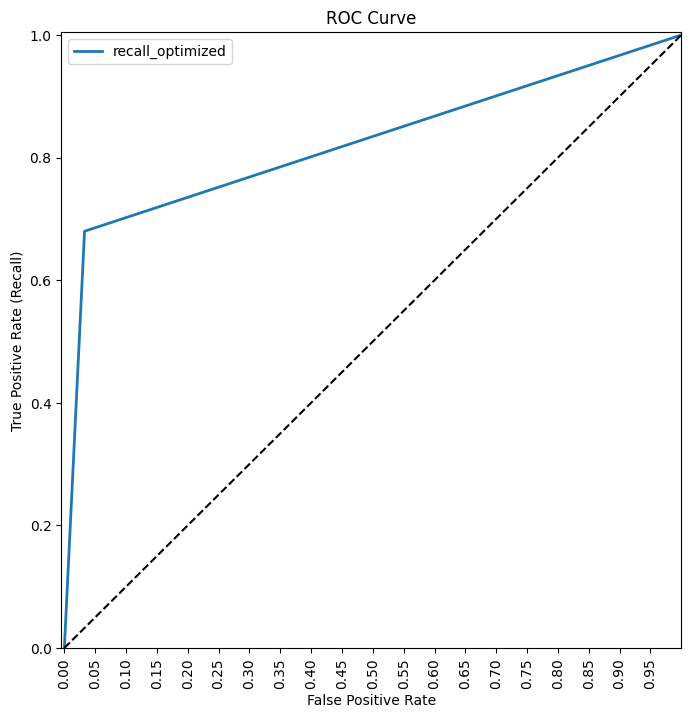

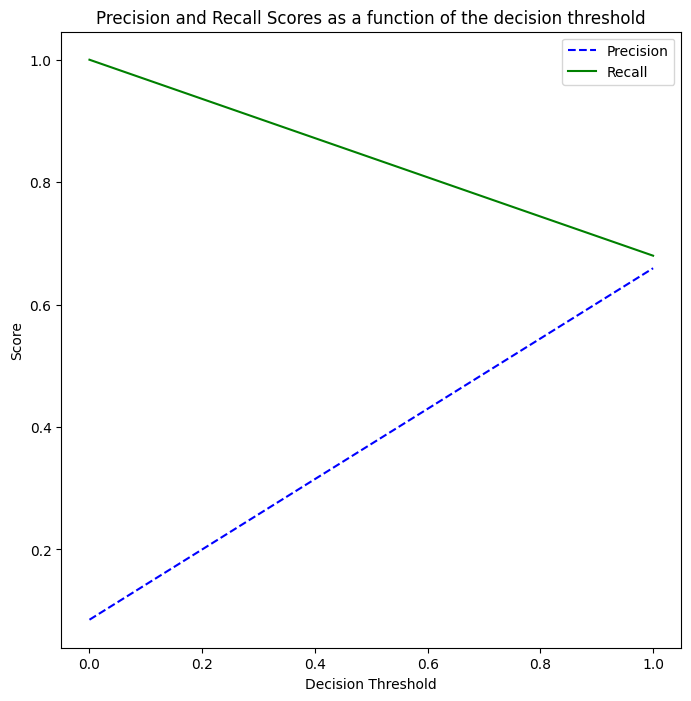

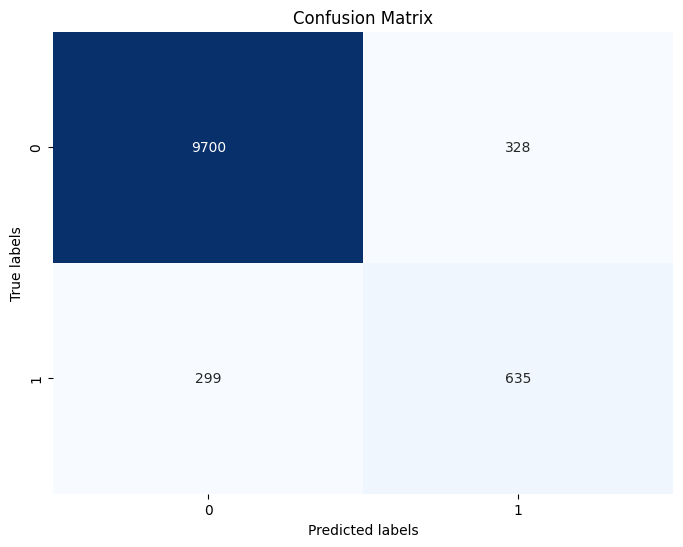

In [94]:
data_dmatrix = xgb.DMatrix(data=x_nor, label=y_nor)

X_train, X_test, y_train, y_test = train_test_split(x_nor,
                                                y_nor,
                                                test_size=0.2,
                                                shuffle = True,
                                                stratify = y_nor,
                                                random_state=42)

xgb_classifier = xgb.XGBClassifier(scale_pos_weight = 3.5)
xgb_best_model = xgb_classifier.fit(x_nor, y_nor)
y_pred = xgb_best_model.predict(X_test)
y_pred_train = xgb_best_model.predict(X_train)

print('Classification Report')
print(classification_report(y_test, y_pred))

print(f'- ROC AUC:   {round(roc_auc_score(y_test, y_pred) * 100, 1)} %')
print(f'- Precision: {round(precision_score(y_test, y_pred)*100,1)} %')
print(f'- Recall:    {round(recall_score(y_test, y_pred)*100,1)} %')
print(f'- Accuracy:  {round(accuracy_score(y_test, y_pred)*100,1)} %')
print(f'- F1-Score:  {round(f1_score(y_test, y_pred)*100,1)} %')

fpr, tpr, auc_thresholds = roc_curve(y_test, y_pred)
plot_roc_curve(fpr, tpr, 'recall_optimized')

p, r, thresholds = precision_recall_curve(y_test, y_pred)
plot_precision_recall_vs_threshold(p, r, thresholds)

plot_confusion_matrix(y_test, y_pred)

In [95]:
# Save Machine Learning Model
pickle.dump(xgb_best_model, open('XGBoost_model.pkl', 'wb'))

# Load and print Model score
loaded_model = pickle.load(open('XGBoost_model.pkl', 'rb'))
result = loaded_model.score(X_test, y_test)
print(f'Model score: {result}')

#print model score to check if the model is overfitting or not
print(f'train score: {np.round(loaded_model.score(X_train, y_train)*100, 2)} %')
print(f'test score:  {np.round(loaded_model.score(X_test, y_test)*100, 2)} %')

Model score: 0.9428024083196497
train score: 94.02 %
test score:  94.28 %
